# Convolutional Neural Networks

## Project: Write an Algorithm for a Dog Identification App 

---

In this notebook, some template code has already been provided for you, and you will need to implement additional functionality to successfully complete this project. You will not need to modify the included code beyond what is requested. Sections that begin with **'(IMPLEMENTATION)'** in the header indicate that the following block of code will require additional functionality which you must provide. Instructions will be provided for each section, and the specifics of the implementation are marked in the code block with a 'TODO' statement. Please be sure to read the instructions carefully! 

> **Note**: Once you have completed all of the code implementations, you need to finalize your work by exporting the Jupyter Notebook as an HTML document. Before exporting the notebook to html, all of the code cells need to have been run so that reviewers can see the final implementation and output. You can then export the notebook by using the menu above and navigating to **File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question X'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut.  Markdown cells can be edited by double-clicking the cell to enter edit mode.

The rubric contains _optional_ "Stand Out Suggestions" for enhancing the project beyond the minimum requirements. If you decide to pursue the "Stand Out Suggestions", you should include the code in this Jupyter notebook.



---
### Why We're Here 

In this notebook, you will make the first steps towards developing an algorithm that could be used as part of a mobile or web app.  At the end of this project, your code will accept any user-supplied image as input.  If a dog is detected in the image, it will provide an estimate of the dog's breed.  If a human is detected, it will provide an estimate of the dog breed that is most resembling.  The image below displays potential sample output of your finished project (... but we expect that each student's algorithm will behave differently!). 

![Sample Dog Output](images/sample_dog_output.png)

In this real-world setting, you will need to piece together a series of models to perform different tasks; for instance, the algorithm that detects humans in an image will be different from the CNN that infers dog breed.  There are many points of possible failure, and no perfect algorithm exists.  Your imperfect solution will nonetheless create a fun user experience!

### The Road Ahead

We break the notebook into separate steps.  Feel free to use the links below to navigate the notebook.

* [Step 0](#step0): Import Datasets
* [Step 1](#step1): Detect Humans
* [Step 2](#step2): Detect Dogs
* [Step 3](#step3): Create a CNN to Classify Dog Breeds (from Scratch)
* [Step 4](#step4): Create a CNN to Classify Dog Breeds (using Transfer Learning)
* [Step 5](#step5): Write your Algorithm
* [Step 6](#step6): Test Your Algorithm

---
<a id='step0'></a>
## Step 0: Import Datasets

Make sure that you've downloaded the required human and dog datasets:
* Download the [dog dataset](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/dogImages.zip).  Unzip the folder and place it in this project's home directory, at the location `/dogImages`. 

* Download the [human dataset](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/lfw.zip).  Unzip the folder and place it in the home directory, at location `/lfw`.  

*Note: If you are using a Windows machine, you are encouraged to use [7zip](http://www.7-zip.org/) to extract the folder.*

In the code cell below, we save the file paths for both the human (LFW) dataset and dog dataset in the numpy arrays `human_files` and `dog_files`.

In [1]:
import numpy as np
from glob import glob

# load filenames for human and dog images
human_files = np.array(glob("lfw/*/*"))
dog_files = np.array(glob("dogImages/*/*/*"))

# print number of images in each dataset
print('There are %d total human images.' % len(human_files))
print('There are %d total dog images.' % len(dog_files))

There are 13233 total human images.
There are 8351 total dog images.


<a id='step1'></a>
## Step 1: Detect Humans

In this section, we use OpenCV's implementation of [Haar feature-based cascade classifiers](http://docs.opencv.org/trunk/d7/d8b/tutorial_py_face_detection.html) to detect human faces in images.  

OpenCV provides many pre-trained face detectors, stored as XML files on [github](https://github.com/opencv/opencv/tree/master/data/haarcascades).  We have downloaded one of these detectors and stored it in the `haarcascades` directory.  In the next code cell, we demonstrate how to use this detector to find human faces in a sample image.

Number of detected faces using cv2 haar cascade classifier: 1


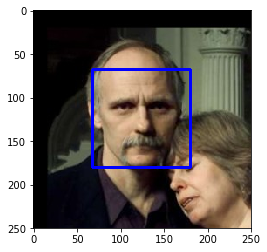

In [2]:
import cv2                
import matplotlib.pyplot as plt                        
%matplotlib inline                               

# extract pre-trained face detector
face_cascade = cv2.CascadeClassifier('haarcascades/haarcascade_frontalface_alt.xml')

# load color (BGR) image
img = cv2.imread(human_files[0])
# convert BGR image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# find faces in image
faces = face_cascade.detectMultiScale(gray)

# print number of faces detected in the image
print('Number of detected faces using cv2 haar cascade classifier:', len(faces))

# get bounding box for each detected face
for (x,y,w,h) in faces:
    # add bounding box to color image
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    
# convert BGR image to RGB for plotting
cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# display the image, along with bounding box
plt.imshow(cv_rgb)
plt.show()

Before using any of the face detectors, it is standard procedure to convert the images to grayscale.  The `detectMultiScale` function executes the classifier stored in `face_cascade` and takes the grayscale image as a parameter.  

In the above code, `faces` is a numpy array of detected faces, where each row corresponds to a detected face.  Each detected face is a 1D array with four entries that specifies the bounding box of the detected face.  The first two entries in the array (extracted in the above code as `x` and `y`) specify the horizontal and vertical positions of the top left corner of the bounding box.  The last two entries in the array (extracted here as `w` and `h`) specify the width and height of the box.

### Write a Human Face Detector

We can use this procedure to write a function that returns `True` if a human face is detected in an image and `False` otherwise.  This function, aptly named `face_detector`, takes a string-valued file path to an image as input and appears in the code block below.

In [3]:
# returns "True" if face is detected in image stored at img_path
def face_detector(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray)
    return len(faces) > 0

### (IMPLEMENTATION) Assess the Human Face Detector

__Question 1:__ Use the code cell below to test the performance of the `face_detector` function.  
- What percentage of the first 100 images in `human_files` have a detected human face?  
- What percentage of the first 100 images in `dog_files` have a detected human face? 

Ideally, we would like 100% of human images with a detected face and 0% of dog images with a detected face.  You will see that our algorithm falls short of this goal, but still gives acceptable performance.  We extract the file paths for the first 100 images from each of the datasets and store them in the numpy arrays `human_files_short` and `dog_files_short`.

__Answer:__ 
(You can print out your results and/or write your percentages in this cell)

In [4]:
from tqdm import tqdm

human_files_short = human_files[:100]
dog_files_short = dog_files[:100]

#-#-# Do NOT modify the code above this line. #-#-#

## TODO: Test the performance of the face_detector algorithm 
## on the images in human_files_short and dog_files_short.

# Evaluation function to test the face detector on a given file list
def eval_face_detector(file_list):
    face_detection_count = 0
    number_of_images = len(file_list)
    for file in file_list:
        face_detection_count += face_detector(file)
    return face_detection_count, number_of_images

In [5]:
# Evaluate the face detector on human files
face_detections_in_human_files, num_of_human_images = eval_face_detector(human_files_short)

# Evaluate the face detector on dog files
face_detections_in_dog_files, num_of_dog_images = eval_face_detector(dog_files_short)

In [6]:
# Percentage of (likely true positive) human detections in human files
if num_of_human_images:
    print('Percentage of images with human detections in human_files_short: %d / %d resp. %3.1f %%\n' % 
          (face_detections_in_human_files, 
           num_of_human_images, 
           face_detections_in_human_files/num_of_human_images*100))
else:
    print('No human sample images selected.')

# Percentage of (most likely false positive) human detections in dog files
if num_of_dog_images:
    print('Percentage of images with human detections in dog_files_short: %d / %d resp. %3.1f %%\n' % 
          (face_detections_in_dog_files, 
           num_of_dog_images, 
           face_detections_in_dog_files/num_of_dog_images*100))
else:
    print('No dog sample images selected.')

Percentage of images with human detections in human_files_short: 97 / 100 resp. 97.0 %

Percentage of images with human detections in dog_files_short: 9 / 100 resp. 9.0 %



**Answers to Question 1:**

    What percentage of the first 100 images in human_files have a detected human face? => 97.0 %
    What percentage of the first 100 images in dog_files have a detected human face? => 9.0 %

We suggest the face detector from OpenCV as a potential way to detect human images in your algorithm, but you are free to explore other approaches, especially approaches that make use of deep learning :).  Please use the code cell below to design and test your own face detection algorithm.  If you decide to pursue this _optional_ task, report performance on `human_files_short` and `dog_files_short`.

In [7]:
### (Optional) 
### TODO: Test performance of another face detection algorithm.
### Feel free to use as many code cells as needed.
def face_bb_detector(img_path, debug_mode=False):
    # Read image stored at img_path (default: BGR format)
    img_bgr = cv2.imread(img_path)
    # Convert BGR color to GRAY scale image
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    # Detect faces using haar cascade classifier
    faces = face_cascade.detectMultiScale(img_gray)
    # Face detection counter
    face_count = 0
    # Get the bounding box for each detected face
    for (x,y,w,h) in faces:
        # Increment face counter
        face_count += 1
        # Add bounding box to color image
        cv2.rectangle(img_bgr,(x,y),(x+w,y+h),(255,0,0),2)
    if debug_mode:
        # Print number of faces detected in the image
        print('Number of faces detected in image:', len(faces))
        # Convert BGR image to RGB for plotting
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        # Display the image, along with bounding box
        plt.imshow(img_rgb)
        plt.show()
    # Return the detected bounding boxes in the image
    return faces, face_count

Length human_files data set:  13233
Number of faces detected in image: 1


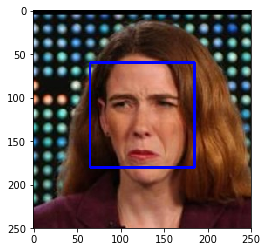

Length dog_files data set:  8351
Number of faces detected in image: 1


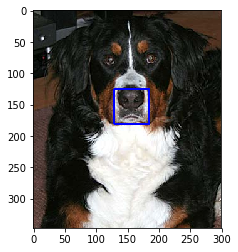

(array([[129, 125,  56,  56]], dtype=int32), 1)

In [8]:
# Select index
index = 99

# Sample human_files data set
print('Length human_files data set: ', len(human_files))
face_bb_detector(human_files[index], debug_mode=True)

# Sample dog_files data set
print('Length dog_files data set: ', len(dog_files))
face_bb_detector(dog_files[index], debug_mode=True)

In [9]:
import operator

In [10]:
# Evaluation function to test the face bounding box detector on a given file list
def eval_face_bb_detector(file_list, debug_mode=False):
    # Count number of detections with 1 face per image, 2 faces per image, 3 faces per image, ... in bins
    face_detections_per_image_bins = {}
    detected_images_with_faces = 0
    total_number_of_images = len(file_list)
    for file in file_list:
        faces, faces_per_image = face_bb_detector(file, debug_mode=debug_mode)
        if faces_per_image > 0:
            detected_images_with_faces += 1
        if faces_per_image in face_detections_per_image_bins:
            face_detections_per_image_bins[faces_per_image] += 1
        else:
            face_detections_per_image_bins[faces_per_image] = 1
    return detected_images_with_faces, total_number_of_images, face_detections_per_image_bins

In [11]:
# Evaluate and print the face bounding box detection results on human_files_short
human_images_with_face_detections, num_of_human_images, face_detections_per_human_image_bins = \
    eval_face_bb_detector(human_files_short, debug_mode=False) # set debug_mode=True to plot face detections

In [12]:
# Evaluate human face detection on images with human faces:
sorted_face_detections_per_human_image_bins = sorted(face_detections_per_human_image_bins.items(), 
                                                     key=operator.itemgetter(0))
# Show how many human faces have been detected in how many of the human images in human_files_short
print('Test human face detection with cv2 haar cascade classifier on human images:\n')
for key, value in sorted_face_detections_per_human_image_bins:
    print('Number of human images with %d human face bounding box detection(s) per image: %d of %d\n' % 
          (key, value, num_of_human_images))
# Total number of human images with face detections (no matter how many face detections per image)
print('Human images with face bounding box detections in total: %d of %d' % 
      (human_images_with_face_detections, num_of_human_images))

Test human face detection with cv2 haar cascade classifier on human images:

Number of human images with 0 human face bounding box detection(s) per image: 3 of 100

Number of human images with 1 human face bounding box detection(s) per image: 91 of 100

Number of human images with 2 human face bounding box detection(s) per image: 5 of 100

Number of human images with 3 human face bounding box detection(s) per image: 1 of 100

Human images with face bounding box detections in total: 97 of 100


In [13]:
# Evaluate and print the face bounding box detection results on dog images
dog_images_with_face_detections, num_of_dog_images, face_detections_per_dog_image_bins = \
    eval_face_bb_detector(dog_files_short, debug_mode=False) # set debug_mode=True to plot face detections

In [14]:
# Evaluate human face detection on images with dogs:
sorted_face_detections_per_dog_image_bins = sorted(face_detections_per_dog_image_bins.items(), 
                                                     key=operator.itemgetter(0))
# Show how many human faces have been detected in how many of the dog images in dog_files_short
print('Test human face detection with cv2 haar cascade classifier on dog images:\n')
for key, value in sorted_face_detections_per_dog_image_bins:
    print('Number of dog images with %d human face bounding box detection(s) per image: %d of %d\n' % 
          (key, value, num_of_dog_images))
# Show total number of dog images with face detections (no matter how many face detections per image)
print('Dog images with face bounding box detections in total: %d of %d' % 
      (dog_images_with_face_detections, num_of_dog_images))

Test human face detection with cv2 haar cascade classifier on dog images:

Number of dog images with 0 human face bounding box detection(s) per image: 91 of 100

Number of dog images with 1 human face bounding box detection(s) per image: 9 of 100

Dog images with face bounding box detections in total: 9 of 100


## Evaluation of an alternative built-in face detector ensemble from openCV libarary

Alternative approach for human face detection using MTCNN classifier ensemble from openCV library

In [15]:
### (Optional) 
### TODO: Test performance of another face detection algorithm.
### Feel free to use as many code cells as needed.
from facenet_pytorch import MTCNN, extract_face # This requires pytorch 
import torch
import numpy as np
import cv2
from PIL import Image, ImageDraw
from IPython import display

In [16]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('Running on device: {}'.format(device))

Running on device: cuda:0


In [17]:
def human_face_detector(img_path, debug_mode=True):
    
    # Set up face detector
    mtcnn_face_detector = MTCNN()
    
    # Convert image to RBG color format
    image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        
    # Detect faces
    # Returns bounding boxes = None, confidence_values = [None] and landmarks = None if no faces are detected
    bounding_boxes, confidence_values, landmarks = mtcnn_face_detector.detect(image, landmarks=True)
    
    # Check if any faces have been detected
    if bounding_boxes is None:
        
        # Set number of faces per image to zero
        faces_per_image = 0
        
        # Return the bounding boxes = None, confidence_values = [None], landmarks = None, faces_per_image = 0
        return bounding_boxes, confidence_values, landmarks, faces_per_image
    else:
        
        # Get number of faces per image
        faces_per_image = len(bounding_boxes)
        
        # Add detected face bounding boxes with confidence values and keypoints to the image
        for (bounding_box, confidence, keypoints) in zip(bounding_boxes, confidence_values, landmarks):
                        
            # Get bounding box position
            upper_left_corner  = (bounding_box[0], bounding_box[1])
            lower_right_corner = (bounding_box[2], bounding_box[3])
            
            # Add face bounding box to the image
            cv2.rectangle(image,
                          upper_left_corner,
                          lower_right_corner,
                          (0,155,255),
                          2)
            
            # Text annotation format
            font                   = cv2.FONT_HERSHEY_SIMPLEX
            bottomLeftCornerOfText = (bounding_box[0], bounding_box[1])
            fontScale              = 1
            fontColor              = (255,255,255)
            lineType               = 2
            
            # Annotate face bounding box with the corresponding confidence value
            cv2.putText(image, str(confidence), 
                        bottomLeftCornerOfText, 
                        font, 
                        fontScale, 
                        fontColor, 
                        lineType)
            
            # Get face keypoints (left_eye, right_eye, nose, mouth_left, mouth_right) for each face bounding box  
            left_eye = tuple(keypoints[0])
            right_eye = tuple(keypoints[1])
            nose = tuple(keypoints[2])
            mouth_left = tuple(keypoints[3])
            mouth_right = tuple(keypoints[4])
            
            # Add keypoints (left_eye, right_eye, nose, mouth_left, mouth_right) to the image    
            cv2.circle(image, left_eye, 2, (0,155,255), 2)
            cv2.circle(image, right_eye, 2, (0,155,255), 2)
            cv2.circle(image, nose, 2, (0,155,255), 2)
            cv2.circle(image, mouth_left, 2, (0,155,255), 2)
            cv2.circle(image, mouth_right, 2, (0,155,255), 2)
    
        if debug_mode:
            
            # Print number of faces detected in the image
            print('Number of faces detected in image:', faces_per_image)
            
            # Display the image, along with bounding box
            plt.imshow(image)
            plt.show()
            
        # Return the bounding boxes, the probabilities and the landmarks of all detected human faces in the image
        return bounding_boxes, confidence_values, landmarks, faces_per_image

Number of faces detected in image: 1


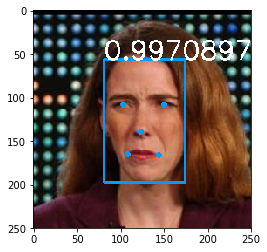

Number of faces detected in image: 2


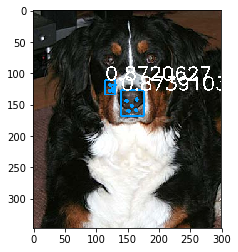

In [18]:
# Select index
index = 99

# Sample human_files data set
boxes, probs, _, _ = human_face_detector(human_files[index], debug_mode=True)

# Sample dog_files data set
boxes, probs, _, _ = human_face_detector(dog_files[index], debug_mode=True)

In [19]:
# Evaluation function to test the face bounding box detector on a given file list
def eval_human_face_detector(file_list, debug_mode=False):
    # Count number of detections with 1 face per image, 2 faces per image, 3 faces per image, ... in bins
    face_detections_per_image_bins = {}
    detected_images_with_faces = 0
    total_number_of_images = len(file_list)
    for file in file_list:
        _ , _ , _ , faces_per_image = human_face_detector(file, debug_mode=debug_mode)
        if faces_per_image > 0:
            detected_images_with_faces += 1
        if faces_per_image in face_detections_per_image_bins:
            face_detections_per_image_bins[faces_per_image] += 1
        else:
            face_detections_per_image_bins[faces_per_image] = 1
    return detected_images_with_faces, total_number_of_images, face_detections_per_image_bins

In [20]:
# Evaluate face bounding box detection using cv2's mtcnn classifier on human images
human_images_with_face_detections, num_of_human_images, face_detections_per_human_image_bins = \
    eval_human_face_detector(human_files_short, debug_mode=False) # set debug_mode=True to plot face detections

In [21]:
# Evaluate human face detection using cv2's mtcnn classifier on images with human faces:
sorted_face_detections_per_human_image_bins = sorted(face_detections_per_human_image_bins.items(), 
                                                     key=operator.itemgetter(0))
# Show how many human faces have been detected in how many of the human images in human_files_short
print('Test human face detection using cv2''s mtcnn classifier on human images:\n')
for key, value in sorted_face_detections_per_human_image_bins:
    print('Number of human images with %d human face bounding box detection(s) per image: %d of %d\n' % 
          (key, value, num_of_human_images))
# Total number of human images with face detections (no matter how many face detections per image)
print('Human images with face bounding box detections in total: %d of %d' % 
      (human_images_with_face_detections, num_of_human_images))

Test human face detection using cv2s mtcnn classifier on human images:

Number of human images with 1 human face bounding box detection(s) per image: 80 of 100

Number of human images with 2 human face bounding box detection(s) per image: 14 of 100

Number of human images with 3 human face bounding box detection(s) per image: 4 of 100

Number of human images with 4 human face bounding box detection(s) per image: 1 of 100

Number of human images with 6 human face bounding box detection(s) per image: 1 of 100

Human images with face bounding box detections in total: 100 of 100


In [22]:
# Evaluate face bounding box detection using cv2's mtcnn classifier on dog images
dog_images_with_face_detections, num_of_dog_images, face_detections_per_dog_image_bins = \
    eval_human_face_detector(dog_files_short, debug_mode=False) # set debug_mode=True to plot face detections

In [23]:
# Evaluate human face detection using cv2's mtcnn classifier on images with dogs:
sorted_face_detections_per_dog_image_bins = sorted(face_detections_per_dog_image_bins.items(), 
                                                     key=operator.itemgetter(0))
# Show how many human faces have been detected in how many of the dog images in dog_files_short
print('Test human face detection using cv2''s mtcnn classifier on dog images:\n')
for key, value in sorted_face_detections_per_dog_image_bins:
    print('Number of dog images with %d human face bounding box detection(s) per image: %d of %d\n' % 
          (key, value, num_of_dog_images))
# Show total number of dog images with face detections (no matter how many face detections per image)
print('Dog images with face bounding box detections in total: %d of %d' % 
      (dog_images_with_face_detections, num_of_dog_images))

Test human face detection using cv2s mtcnn classifier on dog images:

Number of dog images with 0 human face bounding box detection(s) per image: 64 of 100

Number of dog images with 1 human face bounding box detection(s) per image: 33 of 100

Number of dog images with 2 human face bounding box detection(s) per image: 3 of 100

Dog images with face bounding box detections in total: 36 of 100


---
<a id='step2'></a>
## Step 2: Detect Dogs

In this section, we use a [pre-trained model](http://pytorch.org/docs/master/torchvision/models.html) to detect dogs in images.  

### Obtain Pre-trained VGG-16 Model

The code cell below downloads the VGG-16 model, along with weights that have been trained on [ImageNet](http://www.image-net.org/), a very large, very popular dataset used for image classification and other vision tasks.  ImageNet contains over 10 million URLs, each linking to an image containing an object from one of [1000 categories](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a).  

In [24]:
import torch
import torchvision.models as models

# define VGG16 model
VGG16 = models.vgg16(pretrained=True)
print(VGG16)

# check if CUDA is available
use_cuda = torch.cuda.is_available()

# move model to GPU if CUDA is available
if use_cuda:
    VGG16 = VGG16.cuda()

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

Given an image, this pre-trained VGG-16 model returns a prediction (derived from the 1000 possible categories in ImageNet) for the object that is contained in the image.

### (IMPLEMENTATION) Making Predictions with a Pre-trained Model

In the next code cell, you will write a function that accepts a path to an image (such as `'dogImages/train/001.Affenpinscher/Affenpinscher_00001.jpg'`) as input and returns the index corresponding to the ImageNet class that is predicted by the pre-trained VGG-16 model.  The output should always be an integer between 0 and 999, inclusive.

Before writing the function, make sure that you take the time to learn  how to appropriately pre-process tensors for pre-trained models in the [PyTorch documentation](http://pytorch.org/docs/stable/torchvision/models.html).

In [25]:
from PIL import Image
import torchvision.transforms as transforms

# Set PIL to be tolerant of image files that are truncated.
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

def VGG16_predict(img_path, debug_mode):
    '''
    Use pre-trained VGG-16 model to obtain index corresponding to 
    predicted ImageNet class for image at specified path
    
    Args:
        img_path: path to an image
        
    Returns:
        Index corresponding to VGG-16 model's prediction
    '''
    
    ## TODO: Complete the function.
    ## Load and pre-process an image from the given img_path
    ## Return the *index* of the predicted class for that image
    
    # Set up image transformations expected by the model
    predict_transforms = transforms.Compose([transforms.Resize(size=(224,224)), 
                                             transforms.ToTensor(), 
                                             transforms.Normalize([0.485, 0.456, 0.406],
                                                                  [0.229, 0.224, 0.225])])
    
    # Open input image using PIL / pillow
    input_image = Image.open(img_path)
    if debug_mode:
        plt.imshow(input_image)
    
    # Transform input image to input tensor
    input_tensor = predict_transforms(input_image)
    
    # Reshape input tensor and move to cuda device
    if use_cuda:
        input_tensor = input_tensor.view(1, 3, 224, 224).cuda()
    else:
        input_tensor = input_tensor.view(1, 3, 224, 224)
    
    # Set VGG16 model to evaluation mode
    VGG16.eval()
    
    # Switch off gradients for forward prediction step
    with torch.no_grad():
        
        # Move input images to the default device
        #input_tensor = input_tensor.to(device)
        
        # Get log probabilities from the model output
        ps = VGG16.forward(input_tensor)
        
        # Get and print the top candicate
        topk, topclass = ps.topk(1, dim=1)
        
        # Move predicted topclass back to cpu
        if debug_mode:
            print(topk.cpu())
            print('Detected top class: ', topclass.cpu())
        else:
            topk.cpu()
            topclass.cpu()
        
    return topclass # predicted class index

In [26]:
# Test VGG16 prediction
print(VGG16_predict(dog_files[0], debug_mode=False))

tensor([[182]], device='cuda:0')


### (IMPLEMENTATION) Write a Dog Detector

While looking at the [dictionary](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a), you will notice that the categories corresponding to dogs appear in an uninterrupted sequence and correspond to dictionary keys 151-268, inclusive, to include all categories from `'Chihuahua'` to `'Mexican hairless'`.  Thus, in order to check to see if an image is predicted to contain a dog by the pre-trained VGG-16 model, we need only check if the pre-trained model predicts an index between 151 and 268 (inclusive).

Use these ideas to complete the `dog_detector` function below, which returns `True` if a dog is detected in an image (and `False` if not).

In [27]:
# Import imagenet class label index dictionary from file using inbuilt eval() function
with open('imagenet1000_clsidx_to_labels.txt','r') as inf:
    imagenet_idx_to_classlabel = eval(inf.read())
# print(imagenet_idx_to_classlabel)

In [28]:
# Extract sub-dictionary with dog class labels only
idx_to_dogclasslabel = {}
for k in range(151, 269):
    if k in imagenet_idx_to_classlabel:
        idx_to_dogclasslabel[k] = imagenet_idx_to_classlabel[k]
# print(idx_to_dogclasslabel)

In [29]:
### returns "True" if a dog is detected in the image stored at img_path
def VGG16_dog_detector(img_path, debug_mode=False):
    ## TODO: Complete the function.
    
    # Dog detector based on pretrained (unmodified) VGG16
        
    # Use VGG16 to predict an object class index
    obj_class_idx = VGG16_predict(img_path, debug_mode=debug_mode)
    
    # Move obj_class_idx tensor to cpu and convert to integer using numpy()
    class_index = int(obj_class_idx.cpu().numpy().squeeze())
    
    # Check if it's a dog or not: If ob_class_index is within the range 151 and 268 (inclusive) then it is a dog
    prediction = class_index in idx_to_dogclasslabel
    
    # Get true image net class label
    class_label = imagenet_idx_to_classlabel[class_index]
    
    # Return results on cpu
    return prediction, class_index, class_label

tensor([[7.4399]])
Detected top class:  tensor([[906]])
False
906
Windsor tie


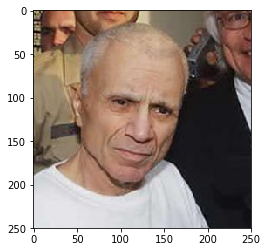

In [30]:
# Select index
index = 9

# Sample human_files data set
img = human_files[index]

# Run dog detector
prediction, class_index, class_label = VGG16_dog_detector(img, debug_mode=True)

# Print prediction resultsa
print(prediction)
print(class_index)
print(class_label)

tensor([[23.7149]])
Detected top class:  tensor([[182]])
True
182
Border terrier


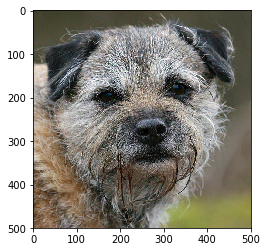

In [31]:
# Select index
index = 9

# Sample dog_files data set
img = dog_files[index]

# Run dog detector
prediction, class_index, class_label = VGG16_dog_detector(img, debug_mode=True)

# Print prediction results
print(prediction)
print(class_index)
print(class_label)

### (IMPLEMENTATION) Assess the Dog Detector

__Question 2:__ Use the code cell below to test the performance of your `dog_detector` function.  
- What percentage of the images in `human_files_short` have a detected dog?  
- What percentage of the images in `dog_files_short` have a detected dog?

__Answer:__ 


In [32]:
### TODO: Test the performance of the dog_detector function
### on the images in human_files_short and dog_files_short.

# Calculate the percentage of images in human_files_short detected as a dog (false positive)
dog_detections_in_human_files_short = np.zeros(human_files_short.shape)
for idx, file in enumerate(human_files_short):
    prediction, class_index, class_label = VGG16_dog_detector(file)
    if prediction:
        dog_detections_in_human_files_short[idx] = 1
print('Percentage of the images in human_files_short classified as a dog (False Positives): ', \
      np.sum(dog_detections_in_human_files_short)/len(human_files_short)*100, '%\n')

# Calculate the percentage of images in dog_files_short with a detected human face
dog_detections_in_dog_files_short = np.zeros(dog_files_short.shape)
for idx, file in enumerate(dog_files_short):
    prediction, class_index, class_label = VGG16_dog_detector(file)
    if prediction:
        dog_detections_in_dog_files_short[idx] = 1
print('Percentage of images in dog_files_short classified as a dog (True Positives): ', \
      np.sum(dog_detections_in_dog_files_short)/len(dog_files_short)*100, '%\n')

Percentage of the images in human_files_short classified as a dog (False Positives):  0.0 %

Percentage of images in dog_files_short classified as a dog (True Positives):  100.0 %



We suggest VGG-16 as a potential network to detect dog images in your algorithm, but you are free to explore other pre-trained networks (such as [Inception-v3](http://pytorch.org/docs/master/torchvision/models.html#inception-v3), [ResNet-50](http://pytorch.org/docs/master/torchvision/models.html#id3), etc).  Please use the code cell below to test other pre-trained PyTorch models.  If you decide to pursue this _optional_ task, report performance on `human_files_short` and `dog_files_short`.

In [33]:
### (Optional) 
### TODO: Report the performance of another pre-trained network.
### Feel free to use as many code cells as needed.
import torch
import torchvision.models as models

# define ResNet50 model using pre-trained weights
ResNet50 = models.resnet50(pretrained=True)
print(ResNet50)

# define Inception-V3 model using pretrained weights
#InceptionV3 = models.inception_v3(pretrained=True)
#print(InceptionV3)

# define GoogLeNet model using pretrained weights
#GoogLeNet = models.googlenet(pretrained=True)
#print(GoogLeNet)

# check if CUDA is available
use_cuda = torch.cuda.is_available()

# move model to GPU if CUDA is available
if use_cuda:
    ResNet50 = ResNet50.cuda()
    print('ResNet50 will run with cuda support.')

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [34]:
# from PIL import Image
# import torchvision.transforms as transforms
# from PIL import ImageFile
# ImageFile.LOAD_TRUNCATED_IMAGES = True     # Set PIL to be tolerant of image files that are truncated

def ResNet50_predict(img_path, debug_mode=False):
    '''
    Use pre-trained ResNet50 model to obtain index corresponding to 
    predicted ImageNet class for image at specified path
    
    Args:
        img_path: path to an image
        
    Returns:
        Index corresponding to ResNet50 model's prediction
    '''
    
    ## TODO: Complete the function.
    ## Load and pre-process an image from the given img_path
    ## Return the *index* of the predicted class for that image
        
    # Set up image transformations expected by the model
    predict_transforms = transforms.Compose([transforms.Resize(size=(224,224)), 
                                       transforms.ToTensor(),
                                       transforms.Normalize([0.485, 0.456, 0.406], 
                                                            [0.229, 0.224, 0.225])])
    
    # Open input image using PIL / pillow
    input_image = Image.open(img_path)
    if debug_mode:
        plt.imshow(input_image)
    
    # Transform input image to input tensor
    input_tensor = predict_transforms(input_image)
    
    # Reshape input tensor and move to cuda device
    if use_cuda:
        input_tensor = input_tensor.view(1, 3, 224, 224).cuda()
    else:
        input_tensor = input_tensor.view(1, 3, 224, 224)
    
    # Set ResNet50 model to evaluation mode
    ResNet50.eval()
    
    # Switch off gradients for forward prediction step
    with torch.no_grad():
        
        # Move input images to the default device
        #input_tensor = input_tensor.to(device)
        
        # Get log probabilities from the model output
        ps = ResNet50.forward(input_tensor)
        
        # Get and print the top candicate
        topk, topclass = ps.topk(1, dim=1)
        
        # Move predicted topclass back to cpu
        if debug_mode:
            print(topk.cpu())
            print('Detected top class: ', topclass.cpu())
        else:
            topclass.cpu()
        
    return topclass # predicted class index

In [35]:
### returns "True" if a dog is detected in the image stored at img_path
def ResNet50_dog_detector(img_path, debug_mode=False):
    ## TODO: Complete the function.
        
    # Use ResNet50 to predict an object class index
    obj_class_idx = ResNet50_predict(img_path, debug_mode=debug_mode)
    
    # Move obj_class_idx tensor to cpu and convert to integer using numpy()
    class_index = int(obj_class_idx.cpu().numpy().squeeze())
    
    # Check if it's a dog or not: If ob_class_index is within the range 151 and 268 (inclusive) then it is a dog
    prediction = class_index in idx_to_dogclasslabel
    
    # Get true image net class label
    class_label = imagenet_idx_to_classlabel[class_index]
    
    # Return results on cpu
    return prediction, class_index, class_label

tensor([[6.1155]])
Detected top class:  tensor([[917]])
False
917
comic book


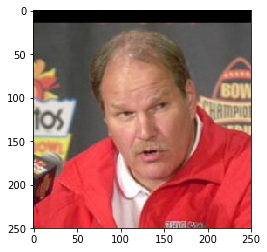

In [36]:
# Select index
index = 27

# Sample human_files data set
img = human_files[index]

# Run dog detector
prediction, class_index, class_label = ResNet50_dog_detector(img, debug_mode=True)

# Print prediction results
print(prediction)
print(class_index)
print(class_label)

tensor([[20.4789]])
Detected top class:  tensor([[182]])
True
182
Border terrier


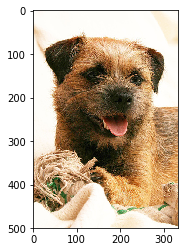

In [37]:
# Select index
index = 27

# Sample dog_files data set
img = dog_files[index]

# Run dog detector
prediction, class_index, class_label = ResNet50_dog_detector(img, debug_mode=True)

# Print prediction results
print(prediction)
print(class_index)
print(class_label)

In [38]:
### TODO: Test the performance of the dog_detector function
### on the images in human_files_short and dog_files_short.

# Calculate the percentage of images in human_files_short detected as a dog (false positive)
dog_detections_in_human_files_short = np.zeros(human_files_short.shape)
for idx, file in enumerate(human_files_short):
    prediction, class_index, class_label = ResNet50_dog_detector(file)
    if prediction:
        dog_detections_in_human_files_short[idx] = 1
print('Percentage of the images in human_files_short classified as a dog (False Positives): ', \
      np.sum(dog_detections_in_human_files_short)/len(human_files_short)*100, '%\n')

# Calculate the percentage of images in dog_files_short with a detected human face
dog_detections_in_dog_files_short = np.zeros(dog_files_short.shape)
for idx, file in enumerate(dog_files_short):
    prediction, class_index, class_label = ResNet50_dog_detector(file)
    if prediction:
        dog_detections_in_dog_files_short[idx] = 1
print('Percentage of images in dog_files_short classified as a dog (True Positives): ', \
      np.sum(dog_detections_in_dog_files_short)/len(dog_files_short)*100, '%\n')

Percentage of the images in human_files_short classified as a dog (False Positives):  1.0 %

Percentage of images in dog_files_short classified as a dog (True Positives):  100.0 %



---
<a id='step3'></a>
## Step 3: Create a CNN to Classify Dog Breeds (from Scratch)

Now that we have functions for detecting humans and dogs in images, we need a way to predict breed from images.  In this step, you will create a CNN that classifies dog breeds.  You must create your CNN _from scratch_ (so, you can't use transfer learning _yet_!), and you must attain a test accuracy of at least 10%.  In Step 4 of this notebook, you will have the opportunity to use transfer learning to create a CNN that attains greatly improved accuracy.

We mention that the task of assigning breed to dogs from images is considered exceptionally challenging.  To see why, consider that *even a human* would have trouble distinguishing between a Brittany and a Welsh Springer Spaniel.  

Brittany | Welsh Springer Spaniel
- | - 
<img src="images/Brittany_02625.jpg" width="100"> | <img src="images/Welsh_springer_spaniel_08203.jpg" width="200">

It is not difficult to find other dog breed pairs with minimal inter-class variation (for instance, Curly-Coated Retrievers and American Water Spaniels).  

Curly-Coated Retriever | American Water Spaniel
- | -
<img src="images/Curly-coated_retriever_03896.jpg" width="200"> | <img src="images/American_water_spaniel_00648.jpg" width="200">


Likewise, recall that labradors come in yellow, chocolate, and black.  Your vision-based algorithm will have to conquer this high intra-class variation to determine how to classify all of these different shades as the same breed.  

Yellow Labrador | Chocolate Labrador | Black Labrador
- | -
<img src="images/Labrador_retriever_06457.jpg" width="150"> | <img src="images/Labrador_retriever_06455.jpg" width="240"> | <img src="images/Labrador_retriever_06449.jpg" width="220">

We also mention that random chance presents an exceptionally low bar: setting aside the fact that the classes are slightly imabalanced, a random guess will provide a correct answer roughly 1 in 133 times, which corresponds to an accuracy of less than 1%.  

Remember that the practice is far ahead of the theory in deep learning.  Experiment with many different architectures, and trust your intuition.  And, of course, have fun!

### (IMPLEMENTATION) Specify Data Loaders for the Dog Dataset

Use the code cell below to write three separate [data loaders](http://pytorch.org/docs/stable/data.html#torch.utils.data.DataLoader) for the training, validation, and test datasets of dog images (located at `dogImages/train`, `dogImages/valid`, and `dogImages/test`, respectively).  You may find [this documentation on custom datasets](http://pytorch.org/docs/stable/torchvision/datasets.html) to be a useful resource.  If you are interested in augmenting your training and/or validation data, check out the wide variety of [transforms](http://pytorch.org/docs/stable/torchvision/transforms.html?highlight=transform)!

In [39]:
import os
import numpy as np
from glob import glob

import matplotlib.pyplot as plt                        
%matplotlib inline

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler

from torchvision import datasets
import torchvision.transforms as transforms
import torchvision.models as models
from torch.utils.data.sampler import SubsetRandomSampler

import cv2
from IPython import display
from PIL import Image, ImageDraw, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True # Set PIL to be tolerant of image files that are truncated.

import time

In [40]:
# Check if CUDA is available
use_cuda = torch.cuda.is_available()
if use_cuda:
    print('GPU is available => Train on GPU using CUDA')
else:
    print(' GPU is not available => Train on CPU.')

GPU is available => Train on GPU using CUDA


In [41]:
### TODO: Write data loaders for training, validation, and test sets
## Specify appropriate transforms, and batch_sizes

# number of subprocesses to use for data loading
num_workers = 0
# how many samples per batch to load
batch_size = 32

# Convert data to torch.FloatTensor
image_transforms = transforms.Compose([transforms.Resize(size=(336,336)),
                                       transforms.RandomRotation(30),                                       
                                       transforms.CenterCrop(size=(224,224)),
                                       transforms.RandomResizedCrop(size=(224,224), 
                                                                    scale=(0.8, 1.0), 
                                                                    ratio=(0.75, 1.3333333333333333), 
                                                                    interpolation=2),
                                       transforms.RandomHorizontalFlip(),
                                       transforms.ToTensor(),
                                       transforms.Normalize([0.485, 0.456, 0.406], 
                                                            [0.229, 0.224, 0.225])])

# Directory where training, validation and testing data are stored
data_dir = "dogImages"

# Pass transforms in here, then run the next cell to see how the transforms look
image_datasets = {x: datasets.ImageFolder(root=os.path.join(data_dir, x), transform=image_transforms) 
                 for x in ['train', 'test', 'valid']}

# Obtain image indices that will be used for training and validation
num_train = len(image_datasets['train'])
train_idx = list(range(num_train))
print('Number of images in training dataset:   ', num_train)
num_valid = len(image_datasets['valid'])
valid_idx = list(range(num_valid))
print('Number of images in validation dataset: ', num_valid)

# Shuffle train and validation indices
np.random.shuffle(train_idx)
np.random.shuffle(valid_idx)

# Define samplers for obtaining training and validation batches
train_sampler = SubsetRandomSampler(train_idx)
valid_sampler = SubsetRandomSampler(valid_idx)

# Get number of images in test dataset
num_test = len(image_datasets['test'])
print('Number of images in test dataset:       ', num_test)

# Prepare the data loaders
train_loader = torch.utils.data.DataLoader(image_datasets['train'], 
                                           batch_size=batch_size,
                                           sampler=train_sampler, 
                                           num_workers=num_workers)
valid_loader = torch.utils.data.DataLoader(image_datasets['valid'], 
                                           batch_size=batch_size,
                                           sampler=valid_sampler,
                                           num_workers=num_workers)
test_loader = torch.utils.data.DataLoader(image_datasets['test'], 
                                          batch_size=batch_size,
                                          num_workers=num_workers)
loaders_scratch = {'train': train_loader, 'valid': valid_loader, 'test': test_loader}

Number of images in training dataset:    6680
Number of images in validation dataset:  835
Number of images in test dataset:        836


In [42]:
# Get class names and number of classes in training, validation and test dataset
class_names = {x: image_datasets[x].classes for x in ['train', 'valid', 'test']}
number_of_classes = {x: len(class_names[x]) for x in ['train', 'valid', 'test']}

print("Number of classes in training dataset:  ", number_of_classes['train'])
print("Number of classes in validation dataset:", number_of_classes['valid'])
print("Number of classes in test dataset:      ", number_of_classes['test'])
if all([number_of_classes['valid'] == number_of_classes['train'], number_of_classes['test'] == number_of_classes['train']]):
    print('\nAll class labels are contained in training, validation and testing dataset => Check i. O.')
elif number_of_classes['valid'] != number_of_classes['train']:
    print('\nThe number of classes in validation and training dataset are not the same! => Check n. i. O.')
else:
    print('\nThe number of classes in test and training dataset are not the same! => Check n. i. O.')

Number of classes in training dataset:   133
Number of classes in validation dataset: 133
Number of classes in test dataset:       133

All class labels are contained in training, validation and testing dataset => Check i. O.


In [43]:
# Get dictionary with dog breeds and indices from 1 to number_of_classes
dog_breeds = {}
for key, value in zip(range(1, number_of_classes['train']+1), image_datasets['train'].classes):
    dog_breeds[key] = value

# Print list of dog breeds
print('\nList of dog breed labels (classes): ')
print('---------------------------------------------------------------------------')
for key, value in dog_breeds.items():
    print('{}: {}'.format(key, value))
print('---------------------------------------------------------------------------\n')


List of dog breed labels (classes): 
---------------------------------------------------------------------------
1: 001.Affenpinscher
2: 002.Afghan_hound
3: 003.Airedale_terrier
4: 004.Akita
5: 005.Alaskan_malamute
6: 006.American_eskimo_dog
7: 007.American_foxhound
8: 008.American_staffordshire_terrier
9: 009.American_water_spaniel
10: 010.Anatolian_shepherd_dog
11: 011.Australian_cattle_dog
12: 012.Australian_shepherd
13: 013.Australian_terrier
14: 014.Basenji
15: 015.Basset_hound
16: 016.Beagle
17: 017.Bearded_collie
18: 018.Beauceron
19: 019.Bedlington_terrier
20: 020.Belgian_malinois
21: 021.Belgian_sheepdog
22: 022.Belgian_tervuren
23: 023.Bernese_mountain_dog
24: 024.Bichon_frise
25: 025.Black_and_tan_coonhound
26: 026.Black_russian_terrier
27: 027.Bloodhound
28: 028.Bluetick_coonhound
29: 029.Border_collie
30: 030.Border_terrier
31: 031.Borzoi
32: 032.Boston_terrier
33: 033.Bouvier_des_flandres
34: 034.Boxer
35: 035.Boykin_spaniel
36: 036.Briard
37: 037.Brittany
38: 038.Brusse


One sample batch of dog images from the training data set:

Image format =  torch.Size([3, 224, 224])


/home/andreas/.local/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


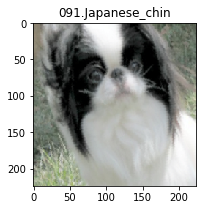

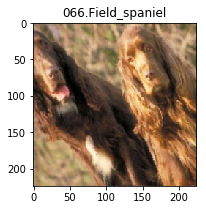

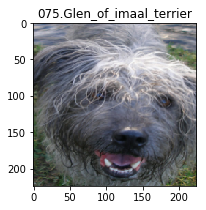

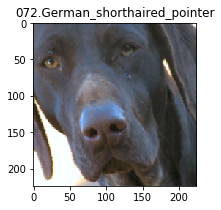

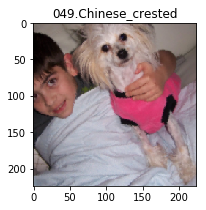

...

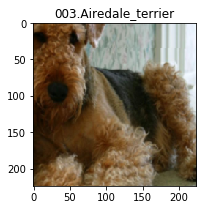

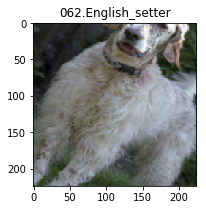

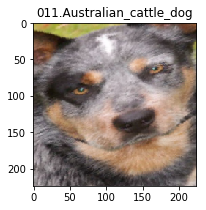

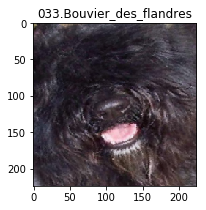

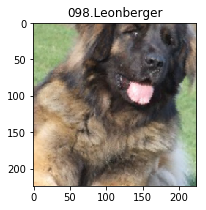

In [44]:
# Visualize one batch of images in the training dataset
images, classes = next(iter(loaders_scratch['train']))

print('\nOne sample batch of dog images from the training data set:')
print('\nImage format = ', images[0].shape)

for image, class_label in zip(images, classes):
    # Detach he tensor from the current graph, maka a copy of this tensor and move it gpu to cpu
    image = image.to('cpu').clone().detach()
    # Transform tensor to numpy array and squeeze singular dimensions
    image = image.numpy().squeeze()
    class_label = class_label.numpy().squeeze()
    # Transpose numpy array => shift color axis to the back
    image = image.transpose(1,2,0)
    # Invert image normalization
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    # Clip input data to valid range for imshow with RGB data
    image = image.clip(0, 1)
    
    # Show image
    fig = plt.figure(figsize=(12,3))
    plt.imshow(image)
    plt.title(class_names['train'][class_label])

**Question 3:** Describe your chosen procedure for preprocessing the data. 
- How does your code resize the images (by cropping, stretching, etc)?  What size did you pick for the input tensor, and why?
- Did you decide to augment the dataset?  If so, how (through translations, flips, rotations, etc)?  If not, why not?


__Answers to Question 3__:
All pre-trained torchvision models (expect for the input images) are normalized in the same way, i.e. mini-batches of 3-channel RGB images of shape (3 x H x W), where H and W are expected to be at least 224. The images have to be loaded in to a range of [0, 1] and then normalized using mean = [0.485, 0.456, 0.406] and std = [0.229, 0.224, 0.225]. This hand-crafted CNN trained from the scratch should thus also be tailored to the same image format. So I have picket the same 224 x 224 x 3 input tensor size as pretrained CNN models included in torch models (VGG16, ResNet50, ...) to have the same format and thus a comparision.

The following image transformations (resizing, cropping and normalization plus data augmentation by rotation and horizontal flipping) have been applied in this order:
    1. Resizing to 336x336 pixel to make sure to get frames without black rim when rotating the original image by up to +/-30°
    2. Random rotation of the resized image by up to +/-30°
    3. Random resize by factor 0.8...1.0 and by ratio 3/4...4/3
    4. Crop the center part of the image with w x h = 224 x 224 rgb format needed by the detector
    5. Random flip the image horizontally
    6. Transform image array to torch tensor
    7. Normalize color image over all three color channels to improve cnn training process using the same normalization parameters as for the pre-trained models in torchvision.models
    
Remark: I have also tried color jitter but that did not lead to an immediate success. So for now I stuck with the above mentioned transformations as in the course examples.

### (IMPLEMENTATION) Model Architecture

Create a CNN to classify dog breed.  Use the template in the code cell below.

In [45]:
import torch.nn as nn
import torch.nn.functional as F

# define the CNN architecture
class Net(nn.Module):
    ### TODO: choose an architecture, and complete the class
    def __init__(self):
        super(Net, self).__init__()
        ## Define layers of a CNN
        # First convolutional layer with 3 x 3 x 3 filter kernel (sees a 3 x 224 x 224 tensor)
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3, stride=1, padding=1)
        # Second convolutional layer with 16 x 3 x 3 filter kernel (sees a 16 x 112 x 112 tensor)
        self.conv2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3, stride=1, padding=1)
        # Thrid convolutional layer with 32 x 3 x 3 filter kernel (sees 32 x 56 x 56 tensor)
        self.conv3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=1)

        # Max pooling layer
        self.pool = nn.MaxPool2d(2, 2)
        # Fully-connected linear layer 1 with 512 nodes (sees a 64 * 28 * 28 tensor)
        self.fc1 = nn.Linear(64 * 28 * 28, 399)
        # Fully-connected linear layer 2 with 133 nodes (sees a 399 x 1 tensor)
        self.fc2 = nn.Linear(399, 133)
        # Dropout layer (p=0.25)
        self.dropout = nn.Dropout(0.25)
        # Batch normalization layer for the last linear layer
        self.batch_norm = nn.BatchNorm1d(num_features=399)
    
    def forward(self, x):
        ## Define forward behavior
        
        # Add convolutional layer 1 with relu activation function and max pooling
        x = self.pool(F.relu(self.conv1(x)))
        
        # Add dropout layer
        x = self.dropout(x)
        
        # Add convolutional layer 2 with relu activation function and max pooling
        x = self.pool(F.relu(self.conv2(x)))
        
        # Add dropout layer
        x = self.dropout(x)
        
        # Add convolutional layer 3 with relu activation function and max pooling
        x = self.pool(F.relu(self.conv3(x)))

        # Add dropout layer
        x = self.dropout(x)
        
        # Flatten 64 x 28 x 28 input tensor to first fully conntected layer
        x = x.view(x.size(0), -1)
        
        # Add fully connected hidden layer 1 with batch normalization and relu activation function
        x = F.relu(self.batch_norm(self.fc1(x)))
        
        # Add dropout layer
        x = self.dropout(x)
        
        # Add fully connected hidden layer 2 without any activation function => return class scores
        # A softmax function will be added by the criterion
        x = self.fc2(x)
        
        # Return output tensor
        return x
    
#-#-# You do NOT have to modify the code below this line. #-#-#

# instantiate the CNN
model_scratch = Net()

# move tensors to GPU if CUDA is available
if use_cuda:
    model_scratch.cuda()

__Question 4:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  

__Answers to Question 4:__

- The input tensor shape (3, 224, 224) is given by the image size, which is used by the other pre-trained CNNs we are comparing this hand-drafted CNN with.
- The number of output classes resp. the output tensor shape (1, 133) is given by the number of dog breeds to be classified.
- The purpose of the first part of the stack is to detect features (characteristic points, edges, corners or models) of the objects to be detected. This is done by convolutional layers with max pooling to reduce the dimensions.
- The lowest part of the CNN consists of a stack of three convolutional layers with small 3x3 convolutional kernels with stride = 1 and padding = 1 what leads to an equally sized filter output per channel. These filter outputs are then passed through a rectified linear unit activation function, and then pass a max pooling layer with a 2x2 kernels each, what divides the dimensions of the max pool output layers by two after each layer. At the same time the depth of the convolutional layer stack is doubled.
- Conv layer 1: input tensor shape = (3, 224, 224), output tensor shape = (16, 112, 112)
- Conv lLayer 2: input tensor shape = (16, 112, 112), output tensor shape = (32, 56, 56)
- Conv layer 3: input tensor shape = (32, 56, 56), output tensor shape = (64, 28, 28)
- The number of convolutional layers determines the complexity of features the CNN is able to learn. The potential complexity increases with the number of convolutional layers. However, I am limited with my GPU resources on my local machine. So I stuck with three convlutional layers (and only 2 fully connected layers).
- After the convolutional stack a classifier with fully connected layers is added to transform the information contained in the output feature maps into class probabilities. The feature maps of conv layer 3 are therefore flattened to a (1, 64 * 28 * 28) tensor
- I have added one 1D batch normalization layer to enhance the classification by a more balanced distribution of values in the first fully connected layer
- I have used 2 fully connected layers because that worked with the mnist example, too.
- Fully connected layer 1: input tensor shape = (1, 64 * 28 * 28) = (1, 50176)
- Fully connected layer 2: input tensor shape = (1, 399)
- Final output tensor shape = (1, 133) => 133 dog breed classes
- As a regularization means I have added an additional dropout layer with 25% dropout probability after each layer (except for the final layer)
- The input tensor is normalized anyway be image transoformation in training, validation, test and prediction
- The softmax function is not added to the output layer because it is already included in the optimization criterion (CrossEntropyLoss)

### (IMPLEMENTATION) Specify Loss Function and Optimizer

Use the next code cell to specify a [loss function](http://pytorch.org/docs/stable/nn.html#loss-functions) and [optimizer](http://pytorch.org/docs/stable/optim.html).  Save the chosen loss function as `criterion_scratch`, and the optimizer as `optimizer_scratch` below.

In [46]:
import torch.optim as optim

### TODO: select loss function
criterion_scratch = nn.CrossEntropyLoss()

### TODO: select optimizer
# optimizer_scratch = optim.SGD(model_scratch.parameters(), lr=0.01)
optimizer_scratch = optim.SGD(model_scratch.parameters(), lr=0.005)
# optimizer_scratch = optim.SGD(model_scratch.parameters(), lr=0.01, momentum=0.9)

### (IMPLEMENTATION) Train and Validate the Model

Train and validate your model in the code cell below.  [Save the final model parameters](http://pytorch.org/docs/master/notes/serialization.html) at filepath `'model_scratch.pt'`.

In [47]:
# the following import is required for training to be robust to truncated images
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

def train(n_epochs, loaders, model, optimizer, criterion, use_cuda, save_path):
    """returns trained model"""    
    
    # Initialize tracker for minimum validation loss
    valid_loss_min = np.Inf
    
    # initialize variables to monitor training and validation loss progress
    train_loss_progress = np.zeros(n_epochs)
    valid_loss_progress = np.zeros(n_epochs)
    
    # start timer
    start_time = time.time()
    
    for epoch in range(1, n_epochs+1):
        
        # Reset running training and validation loss to zero for every new epoch
        train_loss = 0.
        valid_loss = 0.
        
        # Initialize tracker for number of correct detections and total number of detections in validation set
        valid_correct = 0.
        valid_total = 0.
        
        # set model to training mode
        model.train()
        
        ###################
        # train the model #
        ###################
        for batch_idx, (data, target) in enumerate(loaders['train']):
            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()
                # data, target = data.to(device), target.to(device)
            # Switch off gradients
            optimizer.zero_grad()
            # Forward pass: Compute predicted outputs by passing an input tensor to the model
            output = model(data)
            # Calculate the current batch loss
            loss = criterion(output, target)
            # Backward pass: Compute gradient of the batch loss with respect to model parameters
            loss.backward()
            # Perform a single optimization step and update the model parameters
            optimizer.step()
            # Update running training loss weighted by the current batch size
            train_loss += loss.item()*data.size(0)
            
        # Calculate average training loss over an epoch 
        # (=> divide running training loss by training dataset size)
        train_loss = train_loss/len(loaders['train'].sampler)
        
        # Store the average training loss of this epoch
        train_loss_progress[epoch-1] = train_loss
        
        # set model to evaluation mode
        model.eval()
        
        ######################    
        # validate the model #
        ######################
        for batch_idx, (data, target) in enumerate(loaders['valid']):
            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()
                # data, target = data.to(device), target.to(device)
            # Forward pass: Compute predicted outputs by passing an input tensor to the model
            output = model(data)
            # Calculate the current batch loss
            loss = criterion(output, target)
            # Update running validation loss weighted by the current batch size
            valid_loss += loss.item()*data.size(0)
            # Convert output probabilities to predicted class label
            pred = output.data.max(1, keepdim=True)[1]
            # Compare predictions to true label
            valid_correct += np.sum(np.squeeze(pred.eq(target.data.view_as(pred))).cpu().numpy())
            # Update total number of detections
            valid_total += data.size(0)
        
        # Calculate average validation loss over an epoch
        # (=> divide running validation loss by validation dataset size)
        valid_loss = valid_loss/len(loaders['valid'].sampler)
        
        # Store the average validation loss of this epoch
        valid_loss_progress[epoch-1] = valid_loss
         
        # get elapsed time
        elapsed_time = time.time() - start_time
        
        print(f"Epoch {epoch}/{n_epochs}.. "
              f"train loss: {train_loss:.3f}.. "
              f"val. loss: {valid_loss:.3f}.. "
              f"val. accuracy: {100. * valid_correct / valid_total:.1f}.. "
              f"elapsed time: {elapsed_time//3600:.0f} h "
              f"{(elapsed_time%3600)//60:.0f} min "
              f"{(elapsed_time%3600)%60:.0f} s")
        
        ## TODO: save the model if validation loss has decreased
        if valid_loss <= valid_loss_min:
            print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(
                valid_loss_min,
                valid_loss))
            torch.save(model.state_dict(), save_path)
            valid_loss_min = valid_loss
    
    # Return trained model
    return model, train_loss_progress, valid_loss_progress

In [48]:
# number of training epochs
n_epochs = 100

# train the model built from scratch
# Remark: After 100 iterations and a learning rate of 0.01 the model starts overfitting
model_scratch, train_loss_progress_scratch, valid_loss_progress_scratch = train(n_epochs,
                                                                                loaders_scratch,
                                                                                model_scratch,
                                                                                optimizer_scratch,
                                                                                criterion_scratch,
                                                                                use_cuda,
                                                                                'model_scratch.pt')

# load the model that got the best validation accuracy
model_scratch.load_state_dict(torch.load('model_scratch.pt'))

Epoch 1/100.. train loss: 4.728.. val. loss: 4.787.. val. accuracy: 2.3.. elapsed time: 0 h 1 min 43 s
Validation loss decreased (inf --> 4.786635).  Saving model ...
Epoch 2/100.. train loss: 4.474.. val. loss: 4.721.. val. accuracy: 1.9.. elapsed time: 0 h 3 min 26 s
Validation loss decreased (4.786635 --> 4.721079).  Saving model ...
Epoch 3/100.. train loss: 4.365.. val. loss: 4.734.. val. accuracy: 3.0.. elapsed time: 0 h 5 min 7 s
Epoch 4/100.. train loss: 4.302.. val. loss: 4.700.. val. accuracy: 3.1.. elapsed time: 0 h 6 min 49 s
Validation loss decreased (4.721079 --> 4.700336).  Saving model ...
Epoch 5/100.. train loss: 4.228.. val. loss: 4.762.. val. accuracy: 1.8.. elapsed time: 0 h 8 min 32 s
Epoch 6/100.. train loss: 4.160.. val. loss: 4.707.. val. accuracy: 2.9.. elapsed time: 0 h 10 min 13 s
Epoch 7/100.. train loss: 4.094.. val. loss: 4.656.. val. accuracy: 3.0.. elapsed time: 0 h 11 min 55 s
Validation loss decreased (4.700336 --> 4.656130).  Saving model ...
Epoch 8

Epoch 63/100.. train loss: 2.137.. val. loss: 4.034.. val. accuracy: 10.9.. elapsed time: 1 h 47 min 11 s
Epoch 64/100.. train loss: 2.136.. val. loss: 3.949.. val. accuracy: 12.7.. elapsed time: 1 h 49 min 4 s
Epoch 65/100.. train loss: 2.104.. val. loss: 3.964.. val. accuracy: 10.9.. elapsed time: 1 h 50 min 58 s
Epoch 66/100.. train loss: 2.067.. val. loss: 3.897.. val. accuracy: 13.2.. elapsed time: 1 h 52 min 50 s
Epoch 67/100.. train loss: 2.045.. val. loss: 3.920.. val. accuracy: 12.1.. elapsed time: 1 h 54 min 37 s
Epoch 68/100.. train loss: 2.034.. val. loss: 3.887.. val. accuracy: 12.0.. elapsed time: 1 h 56 min 22 s
Epoch 69/100.. train loss: 1.986.. val. loss: 4.097.. val. accuracy: 11.0.. elapsed time: 1 h 58 min 14 s
Epoch 70/100.. train loss: 1.966.. val. loss: 3.889.. val. accuracy: 13.5.. elapsed time: 1 h 59 min 60 s
Epoch 71/100.. train loss: 1.932.. val. loss: 3.891.. val. accuracy: 12.8.. elapsed time: 2 h 1 min 44 s
Epoch 72/100.. train loss: 1.912.. val. loss: 3.

<All keys matched successfully>

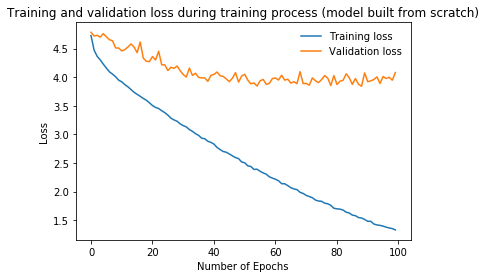

In [49]:
# Visualize the training progress by plotting training and validation loss over the number of epochs
plt.plot(train_loss_progress_scratch, label='Training loss')
plt.plot(valid_loss_progress_scratch, label='Validation loss')
plt.title('Training and validation loss during training process (model built from scratch)')
plt.xlabel('Number of Epochs'), plt.ylabel('Loss')
plt.legend(frameon=False)
plt.show()

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images.  Use the code cell below to calculate and print the test loss and accuracy.  Ensure that your test accuracy is greater than 10%.

In [50]:
def test(loaders, model, criterion, use_cuda):

    # monitor test loss and accuracy
    
    # initialize runnint test loss, number of correct detections and total number of detections
    test_loss = 0.
    correct = 0.
    total = 0.

    model.eval()
    for batch_idx, (data, target) in enumerate(loaders['test']):
        # move to GPU
        if use_cuda:
            data, target = data.cuda(), target.cuda()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the loss
        loss = criterion(output, target)
        # update running test loss weighted by the batch size
        test_loss += loss.item()*data.size(0)
        # convert output probabilities to predicted class label
        pred = output.data.max(1, keepdim=True)[1]
        # compare predictions to true label
        correct += np.sum(np.squeeze(pred.eq(target.data.view_as(pred))).cpu().numpy())
        # update total number of detections
        total += data.size(0)
    
    # Calculate average test loss (=> divide the running test loss by the test dataset size)
    test_loss = test_loss/len(loaders['test'].sampler)
    
    print('Overall test loss: {:.6f}\n'.format(test_loss))
    
    print('\nTest accuracy: {:.1f} % ({:.0f}/{:.0f})'.format(100. * correct / total, correct, total))
    
    return test_loss, correct, total

In [53]:
# Test the CNN model built from the scratch (call test function)
test_loss, correct, total = test(loaders_scratch, model_scratch, criterion_scratch, use_cuda)

Overall test loss: 3.754165


Test accuracy: 14.2 % (119/836)


---
<a id='step4'></a>
## Step 4: Create a CNN to Classify Dog Breeds (using Transfer Learning)

You will now use transfer learning to create a CNN that can identify dog breed from images.  Your CNN must attain at least 60% accuracy on the test set.

### (IMPLEMENTATION) Specify Data Loaders for the Dog Dataset

Use the code cell below to write three separate [data loaders](http://pytorch.org/docs/master/data.html#torch.utils.data.DataLoader) for the training, validation, and test datasets of dog images (located at `dogImages/train`, `dogImages/valid`, and `dogImages/test`, respectively). 

If you like, **you are welcome to use the same data loaders from the previous step**, when you created a CNN from scratch.

In [54]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import matplotlib.pyplot as plt

import os
import torch
import torch.nn as nn
from torch import optim
from torchvision import datasets, transforms, models
from torch.utils.data.sampler import SubsetRandomSampler
from collections import OrderedDict
import numpy as np
import time
#import cv2

In [56]:
## TODO: Specify data loaders
loaders_transfer = loaders_scratch

### (IMPLEMENTATION) Model Architecture

Use transfer learning to create a CNN to classify dog breed.  Use the code cell below, and save your initialized model as the variable `model_transfer`.

In [57]:
# Check if CUDA is available
use_cuda = torch.cuda.is_available()
if use_cuda:
    print('GPU is available => Train on GPU using CUDA')
else:
    print(' GPU is not available => Train on CPU.')

GPU is available => Train on GPU using CUDA


In [58]:
# define ResNet50 model using pretrained weights
model_transfer = models.resnet50(pretrained=True)
# Inspect the modules of the pretrained model
print(model_transfer)
# list(model_transfer.modules())

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [59]:
# Freeze parameters of the base model so we don't backprop through them
for param in model_transfer.parameters():
    param.requires_grad = False

# Keep the convolutional part of the model as "Feature Extractor" and ...
# replace the final linear layer (classifier) with a new classifier that is trained / adapted to this problem
model_transfer.fc = nn.Linear(in_features=2048, out_features=133, bias=True)
print(model_transfer)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [60]:
# Move model to gpu if CUDA is available
if use_cuda:
    model_transfer = model_transfer.cuda()

__Question 5:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  Describe why you think the architecture is suitable for the current problem.

__Answers to Question 5:__ 

- For human detection I just reuse the proposed haar cascade classifier from opencv. I have also tried out mtcnn from facenet_pytorch on my local machine but it needs a higher version of pytorch. It doesn't seem to be so much better than the haar cascade itself excapt for it also exports the landmarks for eyes, nose and mouth, which are not needed here.

- The pre-trained torchvision models show very good performance. They perform ways better than a quickly hand-crafted classifier. They are also comparatively easy to implement resp. to adapt to e. g. the dog breed classification problem without any additional training effort in case they can be directly used. VGG16 for instance is already capable to classify 119 dog breed classes from image net. So I want to go first for a pre-trained model if I can. ResNet50 seems to slightly outperform VGG16 on the test set. So I would prefere this one.

- For dogbreed detection I have chosen the ResNet50 model, which is adapted to dog breed detection via transfer learning considering a higher number of dog breeds (133 dog breeds) in the data set of this course compared to the pre-defined dog breeds covered by ImageNet (119 dog breeds). 

- When applying transfer learning I make use the feature detection capabilities of base network's (e. g. ResNet50) pre-trained feature detector with convolutional layers (parameters are frozen resp. gradients are switched off) and replace the classifier head with a new one. In this case I have chosen a new small classifier head with two fully connected layers, which is then trained on the 133 dog breed classes of this course.

- As we are searching for a unique classification we need to apply some kind of softmax or argmax function on the transfer learning CNN's new output with 133 classes to pick the most likely one.

- For training, validation and testing nn.CrossEntropy() is chosen as optimization criterion. A softmax function is already included in the nn.CrossEntropy() criterion, which combines both nn.LogSoftmax and nn.NLLLoss function. So the classifier head needs to output the class scores, wich are then directly feed to the criterion during optimization.

- For prediction we need to add the softmax or another argmax function if it is only to decide which is the most likely class prediction.

- Due to slow computation in workspace and on my local machine I let the backpropagation only run a few epochs fare before I see any overfitting.

### (IMPLEMENTATION) Specify Loss Function and Optimizer

Use the next code cell to specify a [loss function](http://pytorch.org/docs/master/nn.html#loss-functions) and [optimizer](http://pytorch.org/docs/master/optim.html).  Save the chosen loss function as `criterion_transfer`, and the optimizer as `optimizer_transfer` below.

In [61]:
# Define loss function
criterion_transfer = nn.CrossEntropyLoss()

# Define optimization method
# optimizer_transfer = optim.SGD(model.fc.parameters(), lr=0.001)
optimizer_transfer = optim.Adam(model_transfer.fc.parameters(), lr=0.001)

### (IMPLEMENTATION) Train and Validate the Model

Train and validate your model in the code cell below.  [Save the final model parameters](http://pytorch.org/docs/master/notes/serialization.html) at filepath `'model_transfer.pt'`.

In [62]:
# number of epochs
n_epochs = 15

# train and validate the transfer learning model
# model_transfer = train(n_epochs, loaders_transfer, model_transfer, optimizer_transfer, criterion_transfer, use_cuda, 'model_transfer.pt')
model_transfer, train_loss_progress_transfer, valid_loss_progress_transfer = train(n_epochs,
                                                                                   loaders_transfer,
                                                                                   model_transfer,
                                                                                   optimizer_transfer,
                                                                                   criterion_transfer,
                                                                                   use_cuda,
                                                                                   'model_transfer.pt')

# load the model that got the best validation accuracy (uncomment the line below)
model_transfer.load_state_dict(torch.load('model_transfer.pt'))

Epoch 1/15.. train loss: 2.578.. val. loss: 1.256.. val. accuracy: 67.4.. elapsed time: 0 h 2 min 18 s
Validation loss decreased (inf --> 1.255783).  Saving model ...
Epoch 2/15.. train loss: 1.055.. val. loss: 0.979.. val. accuracy: 71.1.. elapsed time: 0 h 4 min 32 s
Validation loss decreased (1.255783 --> 0.978917).  Saving model ...
Epoch 3/15.. train loss: 0.828.. val. loss: 0.906.. val. accuracy: 71.4.. elapsed time: 0 h 6 min 51 s
Validation loss decreased (0.978917 --> 0.906382).  Saving model ...
Epoch 4/15.. train loss: 0.702.. val. loss: 0.831.. val. accuracy: 73.4.. elapsed time: 0 h 9 min 5 s
Validation loss decreased (0.906382 --> 0.830722).  Saving model ...
Epoch 5/15.. train loss: 0.638.. val. loss: 0.852.. val. accuracy: 73.8.. elapsed time: 0 h 11 min 19 s
Epoch 6/15.. train loss: 0.586.. val. loss: 0.822.. val. accuracy: 73.7.. elapsed time: 0 h 13 min 34 s
Validation loss decreased (0.830722 --> 0.821939).  Saving model ...
Epoch 7/15.. train loss: 0.533.. val. los

<All keys matched successfully>

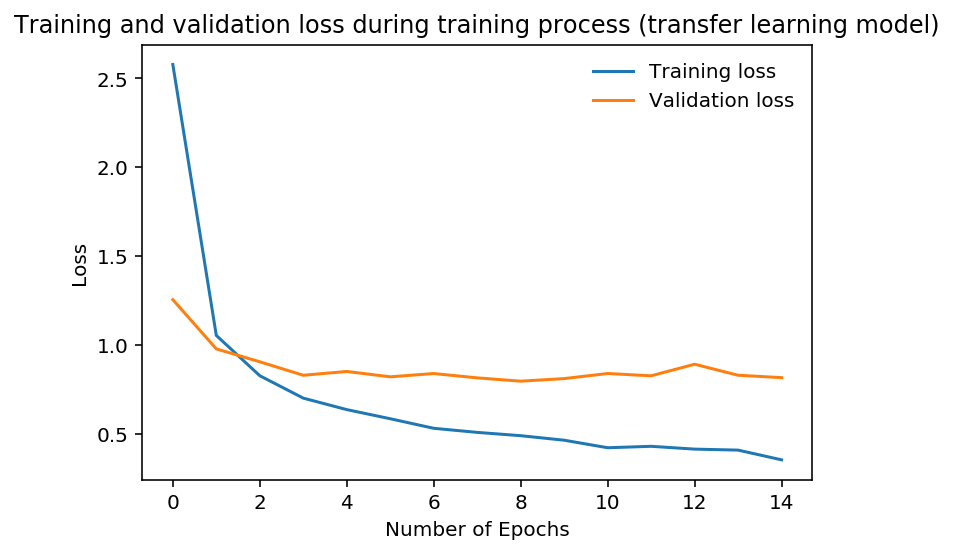

In [63]:
# Visualize the training progress by plotting training and validation loss over the number of epochs
plt.plot(train_loss_progress_transfer, label='Training loss')
plt.plot(valid_loss_progress_transfer, label='Validation loss')
plt.title('Training and validation loss during training process (transfer learning model)')
plt.xlabel('Number of Epochs'), plt.ylabel('Loss')
plt.legend(frameon=False)
plt.show()

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images. Use the code cell below to calculate and print the test loss and accuracy.  Ensure that your test accuracy is greater than 60%.

In [64]:
# Test the transfer learning model (call test function)
test_loss, correct, total = test(loaders_transfer, model_transfer, criterion_transfer, use_cuda)

Overall test loss: 0.789890


Test accuracy: 76.6 % (640/836)


### (IMPLEMENTATION) Predict Dog Breed with the Model

Write a function that takes an image path as input and returns the dog breed (`Affenpinscher`, `Afghan hound`, etc) that is predicted by your model.  

In [65]:
# list of class names by index, i.e. a name can be accessed like class_names[0]
# class_names = [item[4:].replace("_", " ") for item in data_transfer['train'].classes]
dog_breed_class_names = [item[4:].replace("_", " ") for item in image_datasets['train'].classes]
#print(dog_breed_class_names)

In [66]:
### TODO: Write a function that takes a path to an image as input
### and returns the dog breed that is predicted by the model.

def predict_breed_transfer(img_path):
    # load the image and return the predicted dog breed
    
    # Set up image transformations expected by the model      
    predict_transforms = transforms.Compose([transforms.Resize(size=(224,224)), 
                                             transforms.ToTensor(), 
                                             transforms.Normalize([0.485, 0.456, 0.406], 
                                                                  [0.229, 0.224, 0.225])])
    
    # Open input image using PIL / pillow
    input_image = Image.open(img_path)
    
    # Transform input image to input tensor
    input_tensor = predict_transforms(input_image)
    
    # Reshape input tensor and move to cuda device
    if use_cuda:
        input_tensor = input_tensor.view(1, 3, 224, 224).cuda()
    else:
        input_tensor = input_tensor.view(1, 3, 224, 224)
    
    # Set model to evaluation mode
    model_transfer.eval()
    
    # Switch off gradients for forward prediction step
    with torch.no_grad():
        
        # Move input images to the default device
        if use_cuda:
            input_tensor = input_tensor.cuda()
        
        # Get probability scores from the model output
        prob_scores = model_transfer.forward(input_tensor)
        
        # Get the top candicate
        topk, topclass = prob_scores.topk(1, dim=1)
        
        # Move topclass tensor to cpu and convert to integer using numpy()
        topclass_idx = int(topclass.cpu().numpy().squeeze())
        
    # Get dog breed label from dog_breed_class_names dictionary
    dog_breed_label = dog_breed_class_names[topclass_idx]
    
    # Return dog breed class label
    return dog_breed_label
    
    # Open input image using PIL / pillow
    input_image = Image.open(img_path)
    
    # Transform input image to input tensor
    input_tensor = predict_transforms(input_image)
    
    # Reshape input tensor and move to cuda device
    if use_cuda:
        input_tensor = input_tensor.view(1, 3, 224, 224).cuda()
    else:
        input_tensor = input_tensor.view(1, 3, 224, 224)
    
    # Set model to evaluation mode
    model_transfer.eval()
    
    # Switch off gradients for forward prediction step
    with torch.no_grad():
        
        # Move input images to the default device
        if use_cuda:
            input_tensor = input_tensor.cuda()
        
        # Get probability scores from the model output
        prob_scores = model_transfer.forward(input_tensor)
        
        # Get the top candicate
        topk, topclass = prob_scores.topk(1, dim=1)
        
        # Move topclass tensor to cpu and convert to integer using numpy()
        topclass_idx = int(topclass.cpu().numpy().squeeze())
        
    # Get dog breed label from dog_breed_class_names dictionary
    dog_breed_label = dog_breed_class_names[topclass_idx]
    
    # Return dog breed class label
    return dog_breed_label

In [67]:
def show_image(img_path, title="no title"):
    img = Image.open(img_path)
    plt.title(title)
    plt.imshow(img)
    plt.show()

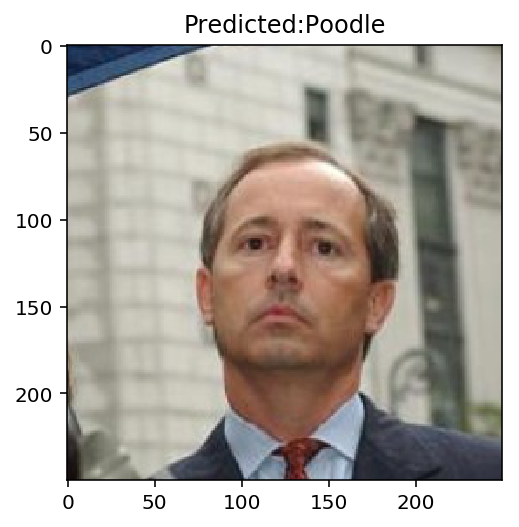

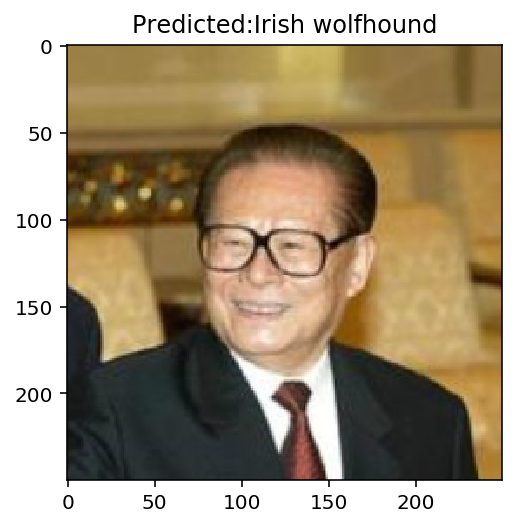

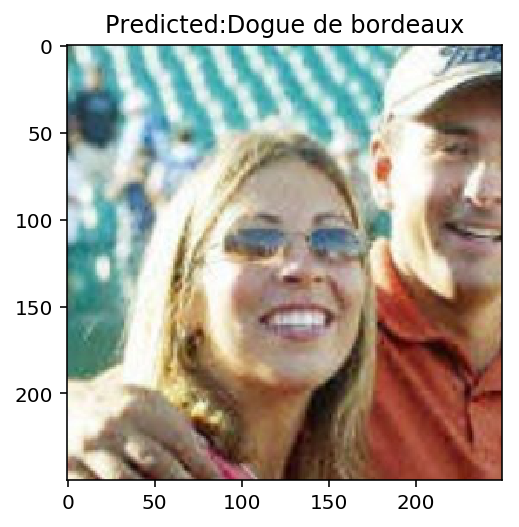

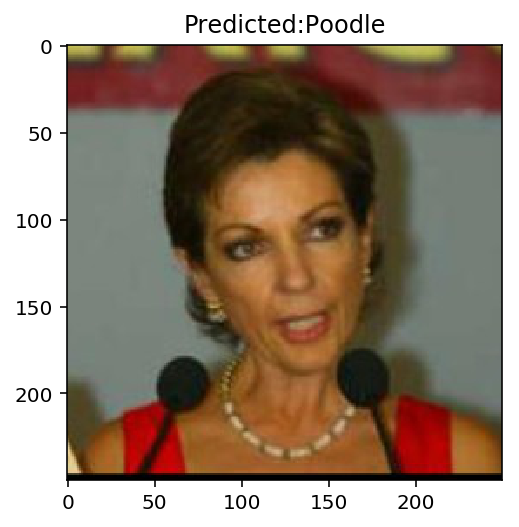

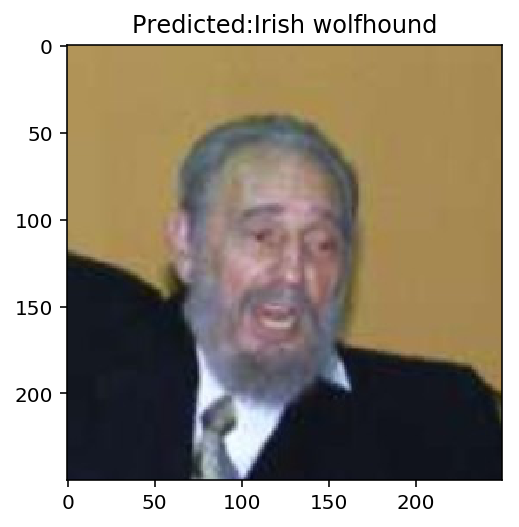

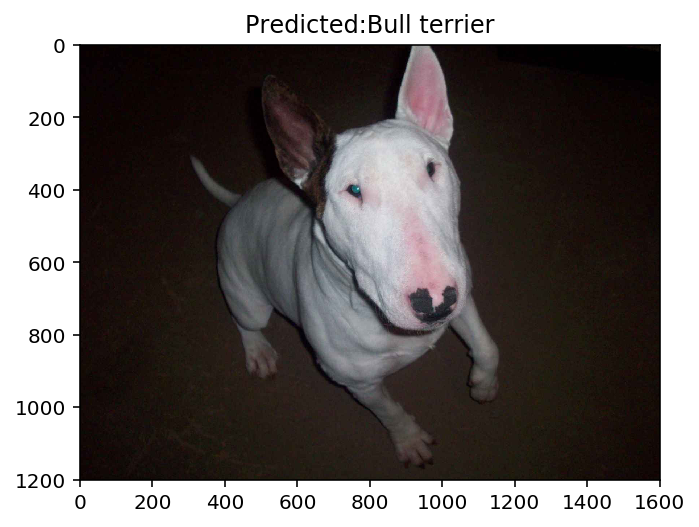

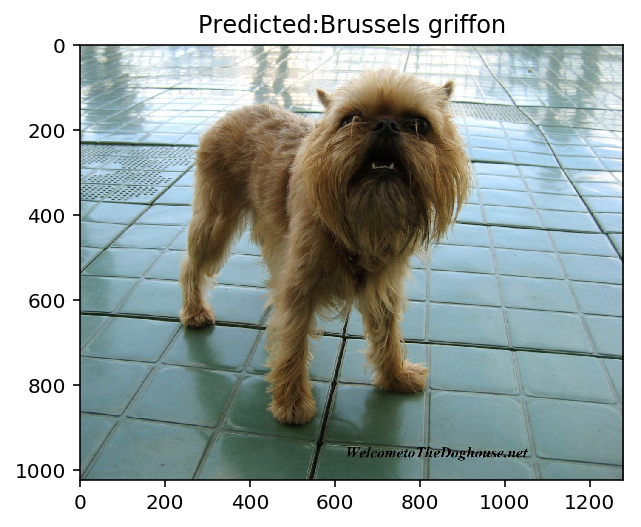

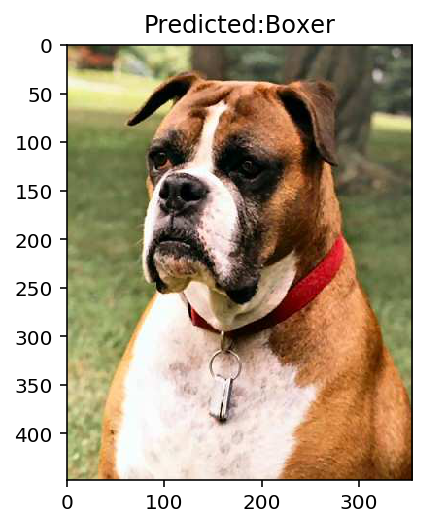

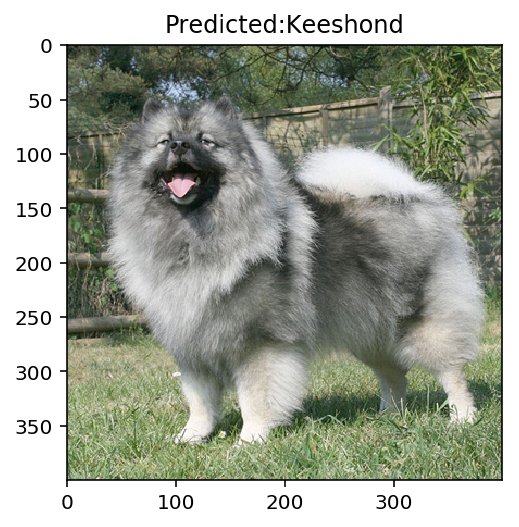

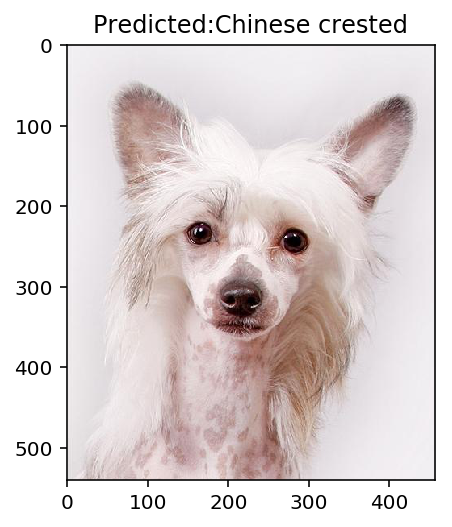

In [68]:
import random

# Test the dog breed detector with random images from human files
for img_path in random.sample(list(human_files), 5): 
    predicted_breed = predict_breed_transfer(img_path)
    show_image(img_path, title=f"Predicted:{predicted_breed}")
    
# Test the dog breed detector with random images from dog files
for img_path in random.sample(list(dog_files), 5): 
    predicted_breed = predict_breed_transfer(img_path)
    show_image(img_path, title=f"Predicted:{predicted_breed}")

---
<a id='step5'></a>
## Step 5: Write your Algorithm

Write an algorithm that accepts a file path to an image and first determines whether the image contains a human, dog, or neither.  Then,
- if a __dog__ is detected in the image, return the predicted breed.
- if a __human__ is detected in the image, return the resembling dog breed.
- if __neither__ is detected in the image, provide output that indicates an error.

You are welcome to write your own functions for detecting humans and dogs in images, but feel free to use the `face_detector` and `dog_detector` functions developed above.  You are __required__ to use your CNN from Step 4 to predict dog breed.  

Some sample output for our algorithm is provided below, but feel free to design your own user experience!

![Sample Human Output](images/sample_human_output.png)


### (IMPLEMENTATION) Write your Algorithm

In [69]:
### TODO: Write your algorithm.
### Feel free to use as many code cells as needed.

def run_app(img_path):
    ## handle cases for a human face, dog, and neither
    
    # check if human faces are detected in the given image using opencv haar cascade classifier
    face_bounding_boxes, faces_per_image = face_bb_detector(img_path, debug_mode=False)
    
    # check if dogs are detected in the given image using VGG16 detector
    dog_prediction, _, _ = ResNet50_dog_detector(img_path, debug_mode=False)
    
    # Get dog breed using ResNet50 trained on 133 classes
    dog_breed_label = predict_breed_transfer(img_path)
       
    if faces_per_image == 0:
        if dog_prediction:
            # Show image
            show_image(img_path, title='This seems to be a dog')
            # Display prediction
            print('The face bounding box detector says there is no human face in the image.')
            print('The dog detector says there is a dog (breed: ', dog_breed_label, ') in the image.')
        else:
            # Show image
            show_image(img_path, title='This seems to be neither human nor dog')
            # Display prediction
            print('The face bounding box detector says there is no human face in the image.')
            print('The dog detector says there is no dog in the image.')
    elif faces_per_image == 1:
        if dog_prediction:
            # Show image
            show_image(img_path, title='This seems to be a human with a dog')
            # Display prediction
            print('The face bounding box detector has detected 1 human face in the image.')
            print('The dog detector says there is a dog (breed: ', dog_breed_label, ') in the image.')
        else:
            # Show image
            show_image(img_path, title='This seems to be a human')
            # Display prediction
            print('The face bounding box detector has detected 1 human face in the image.')
            print('The dog detector says there is no dog in the image.')        
    else:
        if dog_prediction:
            # Show image
            show_image(img_path, title='This seems to be some humans with a dog')
            # Display prediction
            print('The face bounding box detector hase detected ', faces_per_image, ' human faces in the image.')
            print('The dog detector says there is a dog (breed: ', dog_breed_label, ') in the image.')
        else:
            # Show image
            show_image(img_path, title='This seems to be some humans')
            # Display prediction
            print('The face bounding box detector hase detected ', faces_per_image, ' human faces in the image.')
            print('The dog detector says there is no dog in the image.')
    print('\n\n\n')

---
<a id='step6'></a>
## Step 6: Test Your Algorithm

In this section, you will take your new algorithm for a spin!  What kind of dog does the algorithm think that _you_ look like?  If you have a dog, does it predict your dog's breed accurately?  If you have a cat, does it mistakenly think that your cat is a dog?

### (IMPLEMENTATION) Test Your Algorithm on Sample Images!

Test your algorithm at least six images on your computer.  Feel free to use any images you like.  Use at least two human and two dog images.  

__Question 6:__ Is the output better than you expected :) ?  Or worse :( ?  Provide at least three possible points of improvement for your algorithm.

__Answers to Question 6:__ (Three possible points for improvement)
- Analyse and compare further models (evtl. try different classifier head architectures attached to the base network for transfer learning)
- Enlarge and enrich training data set with further human and dog images
- Longer model training (pick the point before overfitting starts)
- Hyperparameter tuning
- Introduce classifier ensembles for both human and dog detection using majority vote
- Code optimization

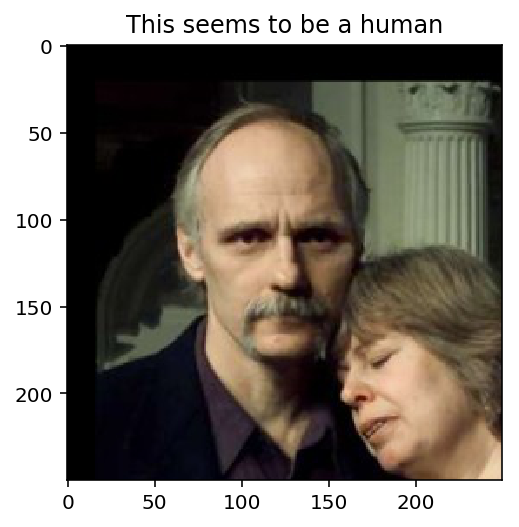

The face bounding box detector has detected 1 human face in the image.
The dog detector says there is no dog in the image.






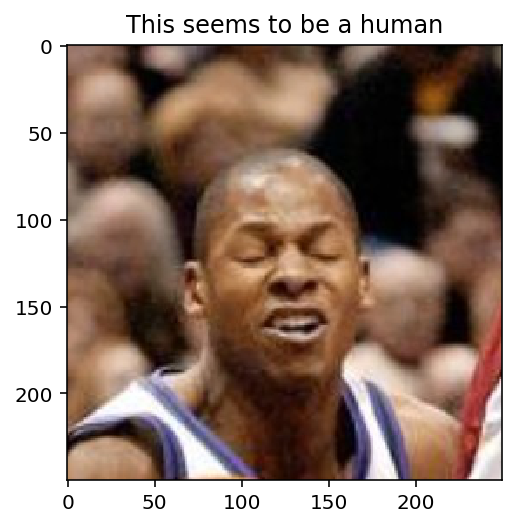

The face bounding box detector has detected 1 human face in the image.
The dog detector says there is no dog in the image.






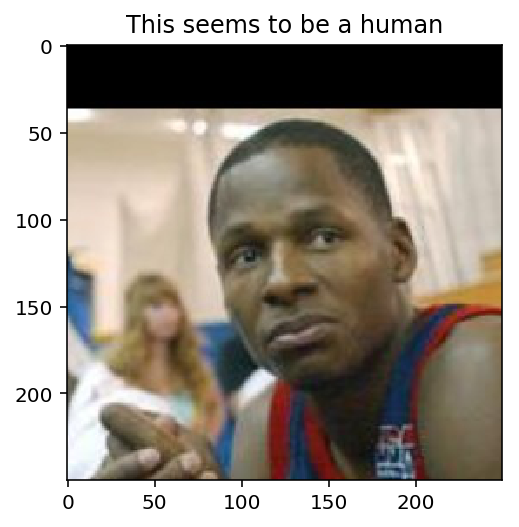

The face bounding box detector has detected 1 human face in the image.
The dog detector says there is no dog in the image.






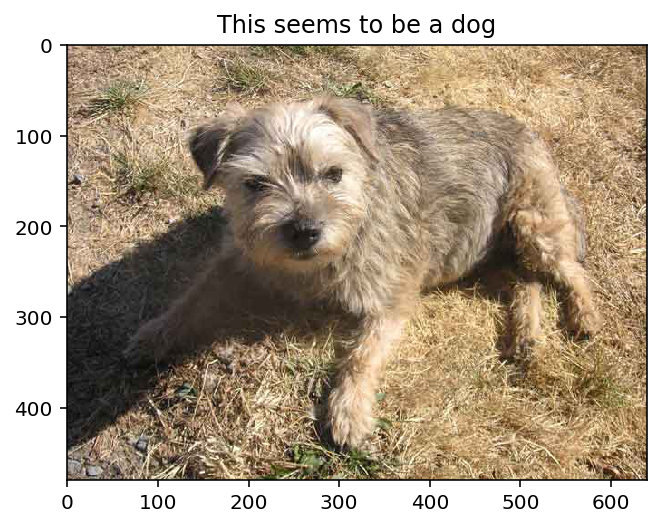

The face bounding box detector says there is no human face in the image.
The dog detector says there is a dog (breed:  Border terrier ) in the image.






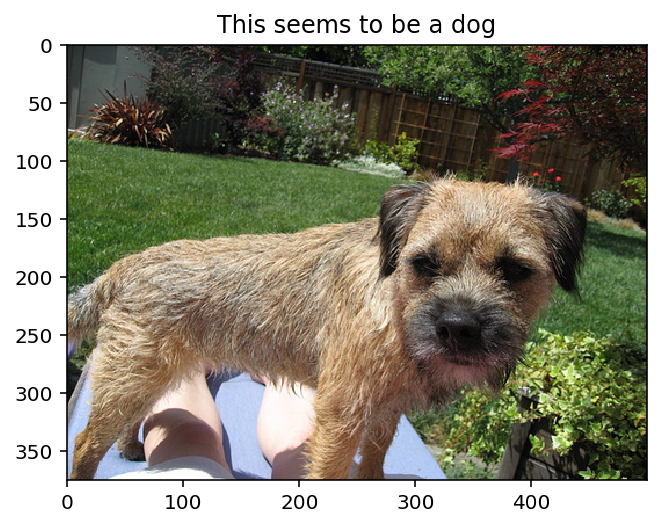

The face bounding box detector says there is no human face in the image.
The dog detector says there is a dog (breed:  Border terrier ) in the image.






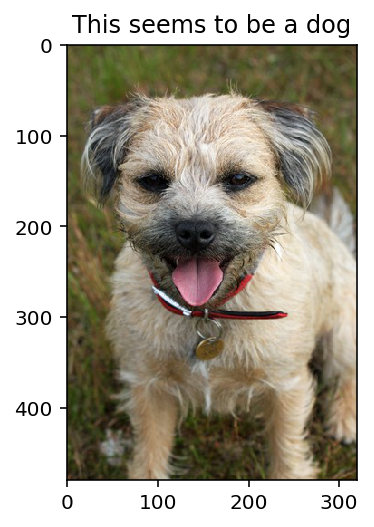

The face bounding box detector says there is no human face in the image.
The dog detector says there is a dog (breed:  Border terrier ) in the image.






In [70]:
## TODO: Execute your algorithm from Step 6 on
## at least 6 images on your computer.
## Feel free to use as many code cells as needed.

## suggested code, below
for file in np.hstack((human_files[:3], dog_files[:3])):
    run_app(file)

In [71]:
path_test_images = 'test_images'
additional_test_images = ('dog_test_image_01.jpg',
                          'dog_test_image_02.jpg',
                          'dog_test_image_03.jpg',
                          'dog_test_image_04.jpg',
                          'dog_test_image_05.jpg',
                          'ape_test_image_01.jpg',
                          'human_test_image_01.jpg',
                          'human_test_image_02.jpg',
                          'human_test_image_03.jpg',
                          'human_test_image_04.jpg',
                          'human_test_image_05.jpg',
                         )

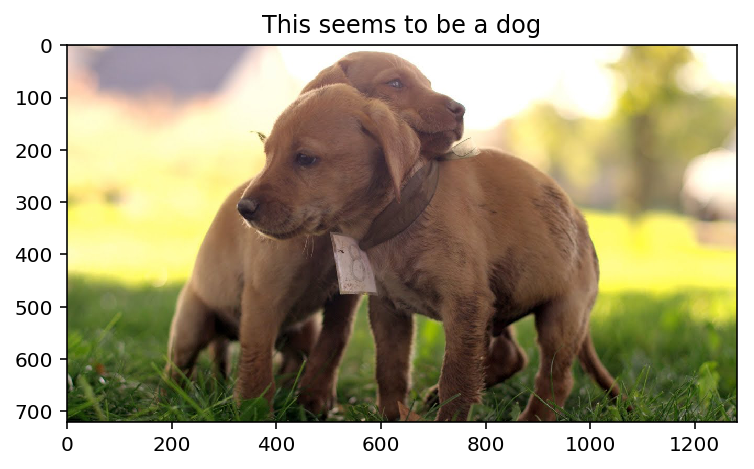

The face bounding box detector says there is no human face in the image.
The dog detector says there is a dog (breed:  Dogue de bordeaux ) in the image.






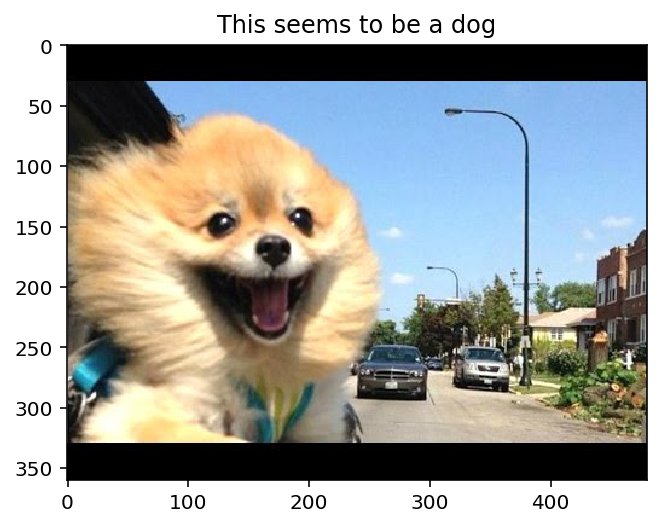

The face bounding box detector says there is no human face in the image.
The dog detector says there is a dog (breed:  Pomeranian ) in the image.






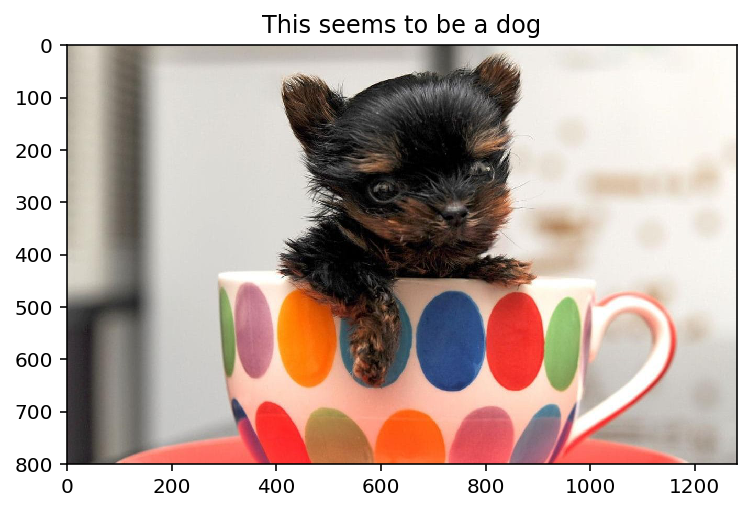

The face bounding box detector says there is no human face in the image.
The dog detector says there is a dog (breed:  Chihuahua ) in the image.






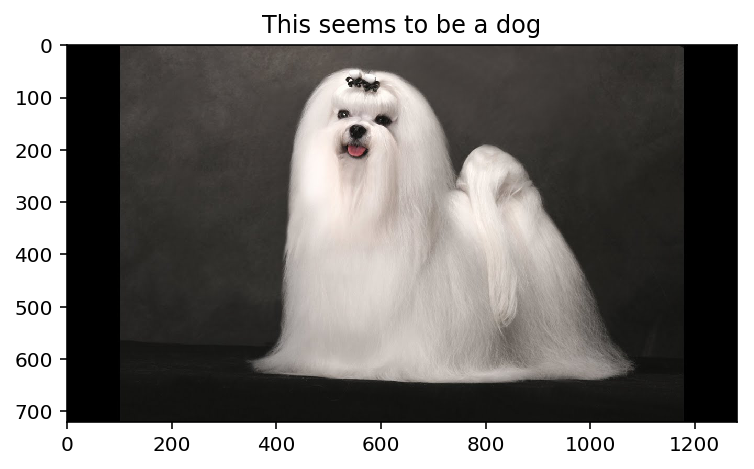

The face bounding box detector says there is no human face in the image.
The dog detector says there is a dog (breed:  Maltese ) in the image.






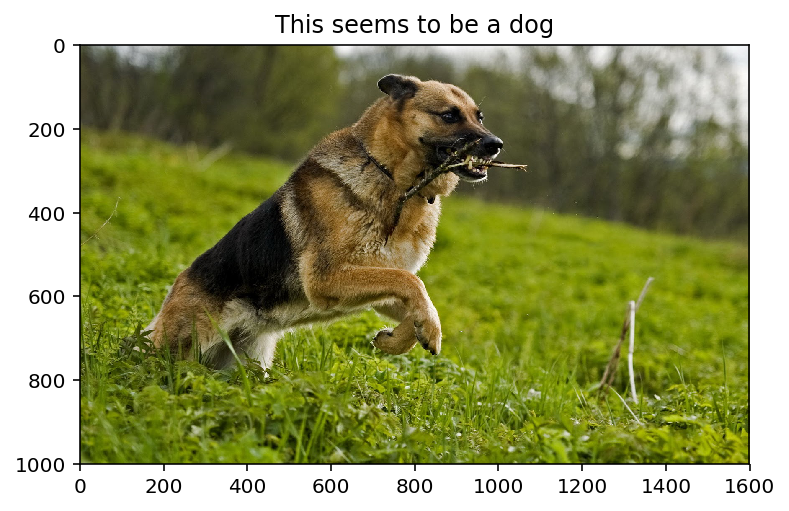

The face bounding box detector says there is no human face in the image.
The dog detector says there is a dog (breed:  German shepherd dog ) in the image.






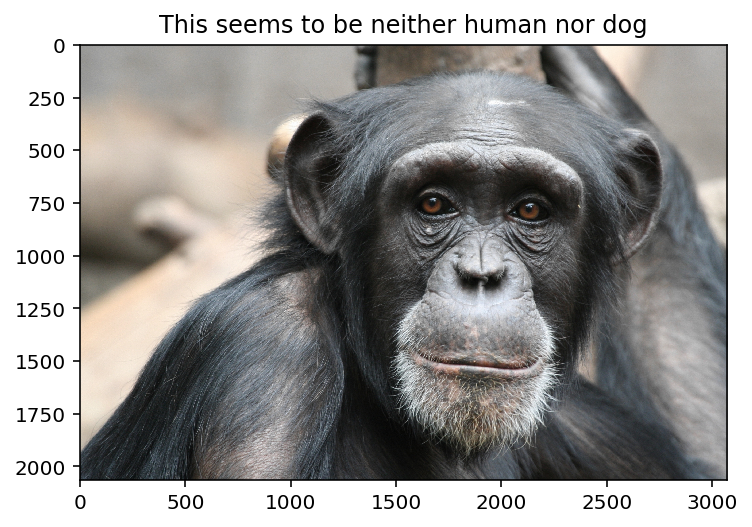

The face bounding box detector says there is no human face in the image.
The dog detector says there is no dog in the image.






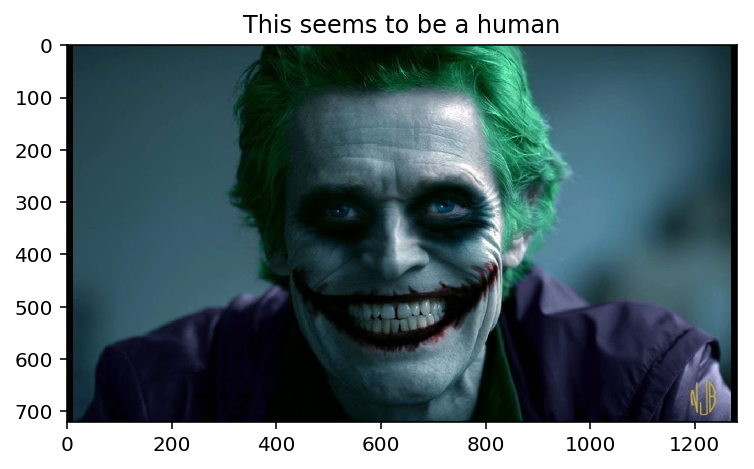

The face bounding box detector has detected 1 human face in the image.
The dog detector says there is no dog in the image.






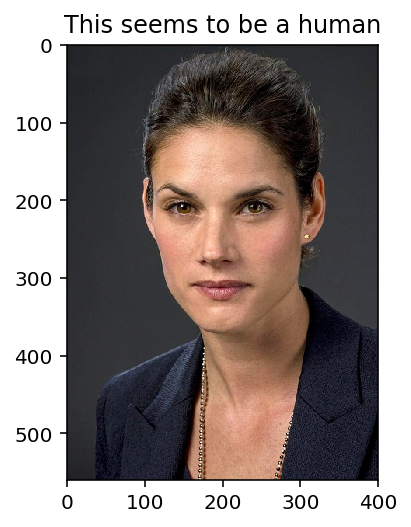

The face bounding box detector has detected 1 human face in the image.
The dog detector says there is no dog in the image.






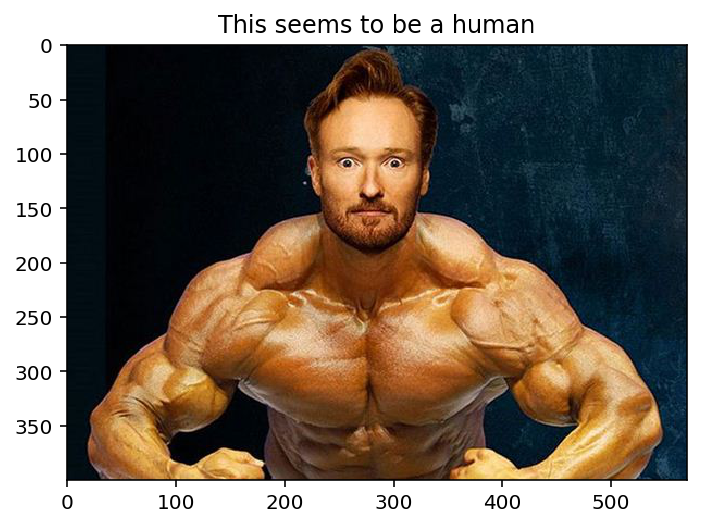

The face bounding box detector has detected 1 human face in the image.
The dog detector says there is no dog in the image.






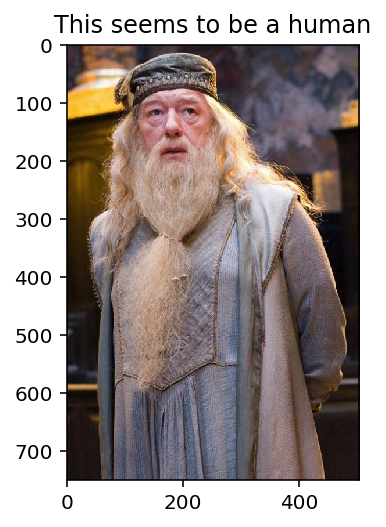

The face bounding box detector has detected 1 human face in the image.
The dog detector says there is no dog in the image.






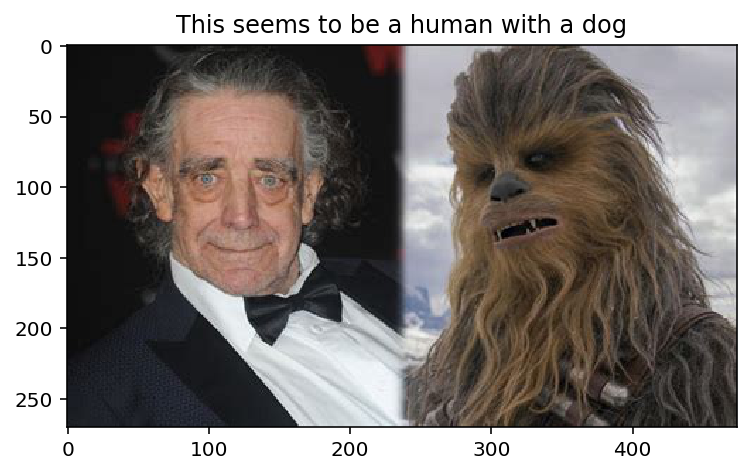

The face bounding box detector has detected 1 human face in the image.
The dog detector says there is a dog (breed:  Yorkshire terrier ) in the image.






In [73]:
for file in additional_test_images:
    run_app(os.path.join(path_test_images, file))